In [1]:
import pyvista as pv
from pyvista import examples
import numpy as np
import open3d as o3d
import vtk
import math
import matplotlib.pyplot as plt
# mesh = examples.download_bunny()
# mesh.plot(cpos='xy')

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [7]:
c2ws = np.load('/home/tw554/plenoxels/opt/test_c2ws.npy')
c2w = c2ws[0]

t = c2w[:3,3]

d = c2w[:3,:3] @ np.array([0,0,1])
d = d / np.linalg.norm(d)

# up = c2w[:3,:3] @ np.array([0,-1,0])
# up = up / np.linalg.norm(up)

up = (0,0,1)

focal_point = t + d


In [30]:
np.linspace(0.37, -0.1, 30)[9]

0.22413793103448276

In [28]:
np.linspace(0.37, -0.1, 30)[15]

0.12689655172413794

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


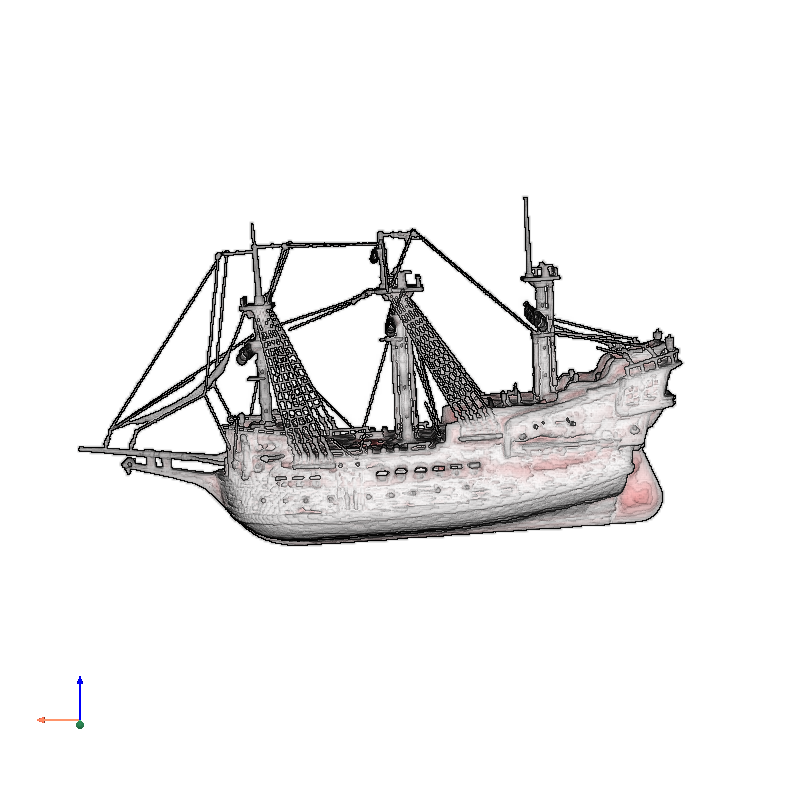

In [31]:

obj = pv.read('/home/tw554/plenoxels/temp/ship.ply')

y_bound = 0.25

mask = (obj.points < 1.5).all(axis=-1) & (obj.points > -1.5).all(axis=-1) & (obj.points[:, 1] < y_bound)
obj['mask'] = mask
obj = obj.threshold(scalars='mask', value=True)





# cpos = p.show(return_cpos=True, return_viewer=False)

obj.plot(scalars='RGB', rgb=True, cpos=(t, focal_point, (0,0,1)), eye_dome_lighting=True,
         point_size=1, show_axes=True, background=background, window_size=(800,800), zoom=0.75,
        screenshot=f'temp/ship.png')
        
        
        

In [25]:
np.linspace(0.37, -0.1, 30)

array([ 0.37      ,  0.3537931 ,  0.33758621,  0.32137931,  0.30517241,
        0.28896552,  0.27275862,  0.25655172,  0.24034483,  0.22413793,
        0.20793103,  0.19172414,  0.17551724,  0.15931034,  0.14310345,
        0.12689655,  0.11068966,  0.09448276,  0.07827586,  0.06206897,
        0.04586207,  0.02965517,  0.01344828, -0.00275862, -0.01896552,
       -0.03517241, -0.05137931, -0.06758621, -0.0837931 , -0.1       ])

In [2]:
obj = pv.read('/home/tw554/plenoxels/temp/vis_063_d2s.ply')

In [31]:
# # intrinsics matrix (3x3)
# K = np.array([[f, 0, cx],
#               [0, f, cy],
#               [0, 0, 1]])]

# array([[ 2.89233057e+03, -2.46525684e-04,  8.23205322e+02,
#          0.00000000e+00],
#        [ 0.00000000e+00,  2.88317529e+03,  6.19070923e+02,
#          0.00000000e+00],
#        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00,
#          0.00000000e+00],
#        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
#          1.00000000e+00]])

focal_len = 2.89233057e+03
# focal_len = 815.1315832201474

# c2w =  np.array([[ 0.9993,  0.0073,  0.0369, -0.1499],
#         [-0.0090,  0.9989,  0.0454, -0.1344],
#         [-0.0365, -0.0457,  0.9983, -0.0290],
#         [ 0.0000,  0.0000,  0.0000,  1.0000]])

c2w =  np.array([[ 9.7026271e-01, -1.4742871e-02, -2.4160498e-01,  1.9083348e+02],
       [ 7.4799112e-03,  9.9949294e-01, -3.0950999e-02, -1.1601868e+00],
       [ 2.4193878e-01,  2.8223416e-02,  9.6988094e-01,  2.4261007e+01],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  1.0000000e+00]])

t = c2w[:3,3]

d = c2w[:3,:3] @ np.array([0,0,1])
d = d / np.linalg.norm(d)

up = c2w[:3,:3] @ np.array([0,-1,0])
up = up / np.linalg.norm(up)

# up = (0,0,1)

focal_point = t + d * 1 # * focal_len

focal_point
up

array([ 0.01474287, -0.99949291, -0.02822342])

In [20]:
up

array([-0.24160498, -0.030951  ,  0.96988096])

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


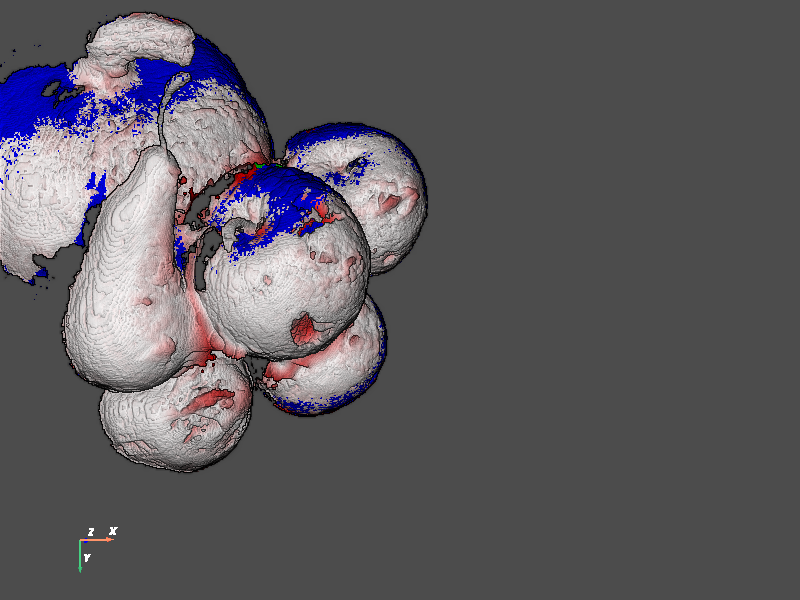

In [36]:
obj.plot(scalars='RGB', rgb=True, cpos=(t, focal_point, up), eye_dome_lighting=True,
         point_size=1, window_size=(800,600), zoom=1.225,
        screenshot=f'temp/dtu.png')


In [4]:
p = pv.Plotter(off_screen=True)

In [6]:
p.camera.up

(0.0, 0.0, 1.0)

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


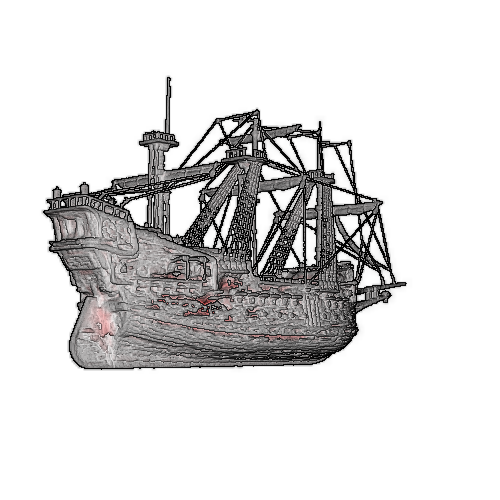

In [6]:
azas = np.linspace(0,360, 11)[:10]
eles = [0, 30]

obj = pv.read('/home/tw554/plenoxels/temp/ship.ply')

mask = (obj.points < 1.5).all(axis=-1) & (obj.points > -1.5).all(axis=-1)
obj['mask'] = mask
obj = obj.threshold(scalars='mask', value=True)

img_size = (500, 500)

p = pv.Plotter(off_screen=True, window_size=img_size)
p.add_mesh(obj)
p.camera.position = (3, 3, 0)
p.camera.focal_point = (0., 0., 0.)

background = 'white'
p.set_background(background)

i = 0

ele = eles[0]
aza = azas[5]

p.camera.azimuth = aza
p.camera.elevation = ele

cpos = (p.camera.position, (0,0,0), p.camera.up)

# cpos = p.show(return_cpos=True, return_viewer=False)

obj.plot(scalars='RGB', rgb=True, cpos=cpos, eye_dome_lighting=True,
         point_size=1, show_axes=False, background=background, window_size=img_size)
        
        
        

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


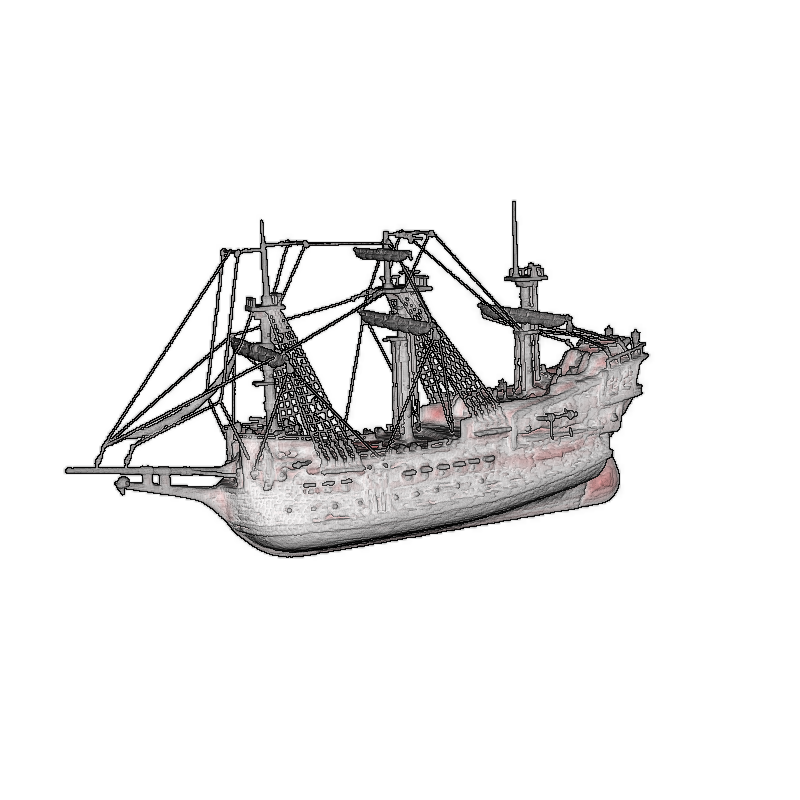

In [104]:
obj = pv.read('/home/tw554/plenoxels/temp/ship.ply')

obj.plot(scalars='RGB', rgb=True, cpos=(t, focal_point, (0,0,1)), eye_dome_lighting=True,
         point_size=1, show_axes=False, background=background, window_size=(800,800), zoom=0.75,
        screenshot=f'temp/ship.png')


# obj.plot(cpos=(t, focal_point, up), eye_dome_lighting=True,
#          point_size=0.1, show_axes=False, background=background, window_size=(1008,756), zoom=0.3,
#         screenshot=f'temp/ship.png')


In [76]:
t

array([-0.1499, -0.1344, -0.029 ])

In [103]:
# # intrinsics matrix (3x3)
# K = np.array([[f, 0, cx],
#               [0, f, cy],
#               [0, 0, 1]])

focal_len = 1111
# focal_len = 815.1315832201474

# c2w =  np.array([[ 0.9993,  0.0073,  0.0369, -0.1499],
#         [-0.0090,  0.9989,  0.0454, -0.1344],
#         [-0.0365, -0.0457,  0.9983, -0.0290],
#         [ 0.0000,  0.0000,  0.0000,  1.0000]])

c2w =  np.array([[-9.1611e-01,  4.1150e-02, -3.9880e-01,  1.6076e+00],
        [ 4.0092e-01,  9.4030e-02, -9.1128e-01,  3.6735e+00],
        [ 3.7253e-09, -9.9472e-01, -1.0264e-01,  4.1375e-01],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]])

t = c2w[:3,3]

d = c2w[:3,:3] @ np.array([0,0,1])
d = d / np.linalg.norm(d)

# t = np.array([-1.1747, -1.1665, -1.0000])
# d = np.array([0.1315, 0.1540, 0.9793])

# ndc_coeffs = (1.6173245698812448, 2.15643275984166)

near = 1

# near_t = (near - t[2]) / d[2]
# t = t + near_t * d
# dx, dy, dz = d
# ox, oy, oz = t

# # Projection
# o0 = ndc_coeffs[0] * (ox / oz)
# o1 = ndc_coeffs[1] * (oy / oz)
# o2 = 1 - 2 * near / oz

# d0 = ndc_coeffs[0] * (dx / dz - ox / oz)
# d1 = ndc_coeffs[1] * (dy / dz - oy / oz)
# d2 = 2 * near / oz;

# t = np.array([o0,o1,o2])
# d = np.array([d0,d1,d2])

# up = c2w[:3,:3] @ np.array([0,-1,0])
# up = up / np.linalg.norm(up)
up = (0,0,1)

focal_point = t + d * focal_len

focal_point


array([ -441.45750572, -1008.75470848,  -113.61885394])

In [105]:
f

1111.0

In [96]:
# # intrinsics matrix (3x3)
# K = np.array([[f, 0, cx],
#               [0, f, cy],
#               [0, 0, 1]])

# focal_len = 1111
focal_len = 815.1315832201474

c2w =  np.array([[ 0.9993,  0.0073,  0.0369, -0.1499],
        [-0.0090,  0.9989,  0.0454, -0.1344],
        [-0.0365, -0.0457,  0.9983, -0.0290],
        [ 0.0000,  0.0000,  0.0000,  1.0000]])

# c2w =  np.array([[-9.1611e-01,  4.1150e-02, -3.9880e-01,  1.6076e+00],
#         [ 4.0092e-01,  9.4030e-02, -9.1128e-01,  3.6735e+00],
#         [ 3.7253e-09, -9.9472e-01, -1.0264e-01,  4.1375e-01],
#         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]])

t = c2w[:3,3]

d = c2w[:3,:3] @ np.array([0,0,1])
d = d / np.linalg.norm(d)

# t = np.array([-1.1747, -1.1665, -1.0000])
# d = np.array([0.1315, 0.1540, 0.9793])

ndc_coeffs = (1.6173245698812448, 2.15643275984166)

near = 1
near_t = (near - t[2]) / d[2]
t = t + near_t * d
dx, dy, dz = d
ox, oy, oz = t

# Projection
o0 = ndc_coeffs[0] * (ox / oz)
o1 = ndc_coeffs[1] * (oy / oz)
o2 = 1 - 2 * near / oz

d0 = ndc_coeffs[0] * (dx / dz - ox / oz)
d1 = ndc_coeffs[1] * (dy / dz - oy / oz)
d2 = 2 * near / oz;

t = np.array([o0,o1,o2])
d = np.array([d0,d1,d2])

up = c2w[:3,:3] @ np.array([0,-1,0])
up = up / np.linalg.norm(up)

focal_point = t + d * 1 #f

focal_point


array([0.0597809 , 0.09806876, 1.        ])

In [83]:
up

array([-0.00730021, -0.99892847,  0.0457013 ])

In [84]:
t

array([-0.1499, -0.1344, -0.029 ])

In [55]:
c2w[:3,:3] @ np.array([0,0,1])

array([-0.3988 , -0.91128, -0.10264])

In [42]:
trans[:3,3]

array([1.6076 , 3.6735 , 0.41375])

In [43]:
trans

array([[-9.1611e-01,  4.1150e-02, -3.9880e-01,  1.6076e+00],
       [ 4.0092e-01,  9.4030e-02, -9.1128e-01,  3.6735e+00],
       [ 3.7253e-09, -9.9472e-01, -1.0264e-01,  4.1375e-01],
       [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]])

In [39]:
viewTransform_to_posFocalViewUp(trans)

(array([-4.11855413e-05, -6.54500000e-06,  4.03116526e+00]),
 array([-4.11892666e-05,  9.94713455e-01,  4.13380526e+00]),
 array([ 0.40092,  0.09403, -0.91128]))

In [7]:
dir(p.camera)

['AddObserver',
 'ApplyTransform',
 'Azimuth',
 'BreakOnError',
 'ComputeViewPlaneNormal',
 'DebugOff',
 'DebugOn',
 'DeepCopy',
 'Dolly',
 'Elevation',
 'FastDelete',
 'GetAddressAsString',
 'GetCameraLightTransformMatrix',
 'GetClassName',
 'GetClippingRange',
 'GetCommand',
 'GetCompositeProjectionTransformMatrix',
 'GetDebug',
 'GetDirectionOfProjection',
 'GetDistance',
 'GetExplicitAspectRatio',
 'GetExplicitProjectionTransformMatrix',
 'GetEyeAngle',
 'GetEyePlaneNormal',
 'GetEyePosition',
 'GetEyeSeparation',
 'GetEyeTransformMatrix',
 'GetFocalDisk',
 'GetFocalDistance',
 'GetFocalPoint',
 'GetFocalPointScale',
 'GetFocalPointShift',
 'GetFreezeFocalPoint',
 'GetFrustumPlanes',
 'GetGlobalWarningDisplay',
 'GetInformation',
 'GetIsInMemkind',
 'GetLeftEye',
 'GetMTime',
 'GetModelTransformMatrix',
 'GetModelViewTransformMatrix',
 'GetModelViewTransformObject',
 'GetNearPlaneScale',
 'GetNearPlaneShift',
 'GetNumberOfGenerationsFromBase',
 'GetNumberOfGenerationsFromBaseType',

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


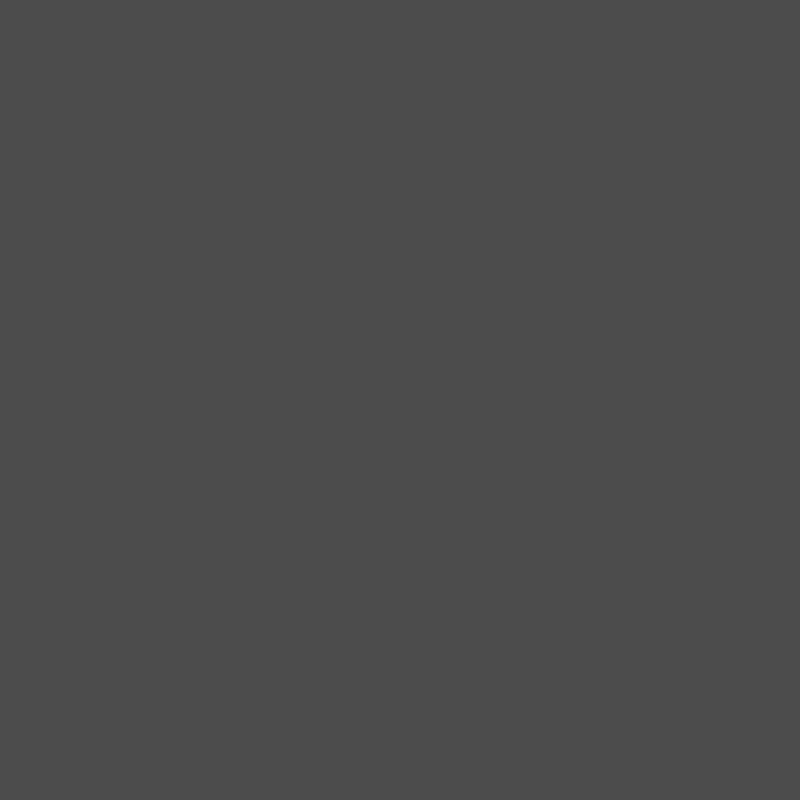

In [30]:
w = 800
h = 800

intrinsic = np.array([[1111,   0.        , 400],
                      [  0.        , 1111, 400],
                      [  0.        ,   0.        ,   1. ]])

extrinsic = np.array([[-9.1611e-01,  4.1150e-02, -3.9880e-01,  1.6076e+00],
        [ 4.0092e-01,  9.4030e-02, -9.1128e-01,  3.6735e+00],
        [ 3.7253e-09, -9.9472e-01, -1.0264e-01,  4.1375e-01],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]])


# renderer
p = pv.Plotter(off_screen=True, window_size=[w,h])


#
# load mesh or point cloud
#
mesh = pv.read('/home/tw554/plenoxels/temp/ship.ply')
p.add_mesh(mesh, rgb=True)


#
# intrinsics
#

cx = intrinsic[0,2]
cy = intrinsic[1,2]
f = intrinsic[0,0]

# convert the principal point to window center (normalized coordinate system) and set it
wcx = -2*(cx - float(w)/2) / w
wcy =  2*(cy - float(h)/2) / h
p.camera.SetWindowCenter(wcx, wcy)

# convert the focal length to view angle and set it
view_angle = 180 / math.pi * (2.0 * math.atan2(h/2.0, f))
p.camera.SetViewAngle(view_angle)


#
# extrinsics
#

# apply the transform to scene objects
p.camera.SetModelTransformMatrix(trans_to_matrix(extrinsic))

# the camera can stay at the origin because we are transforming the scene objects
p.camera.SetPosition(0, 0, 0)

# look in the +Z direction of the camera coordinate system
p.camera.SetFocalPoint(0, 0, 1)

# the camera Y axis points down
p.camera.SetViewUp(0,-1,0)


#
# near/far plane
#

# ensure the relevant range of depths are rendered
# depth_min = 0.1
# depth_max = 100
# p.camera.SetClippingRange(depth_min, depth_max)
# # depth_min, depth_max = p.camera.GetClippingRange()
p.renderer.ResetCameraClippingRange()

p.show()
# p.render()
# p.store_image = True  # last_image and last_image_depth
# p.close()


# # get screen image
# img = p.last_image

# get depth
# # img = p.get_image_depth(fill_value=np.nan, reset_camera_clipping_range=False)
# img = p.last_image_depth

# plt.figure()
# plt.imshow(img)
# plt.colorbar(label='Distance to Camera')
# plt.title('Depth image')
# plt.xlabel('X Pixel')
# plt.ylabel('Y Pixel')
# plt.show()


In [31]:
(p.camera.position, (0,0,0), p.camera.up)

((0.0, 0.0, 0.0), (0, 0, 0), (0.0, -1.0, 0.0))

In [29]:
img

In [37]:
def viewTransform_to_posFocalViewUp(viewTransform):
    orthoViewUp = viewTransform[1, 0:3]
    viewPlaneNormal = viewTransform[2, 0:3]
    position = - np.dot(viewTransform.T[:3,:3] , viewTransform[:3,3])
    focalPoint = position - viewPlaneNormal
    return position, focalPoint, orthoViewUp
viewTransform_to_posFocalViewUp(trans)

(array([-4.11855413e-05, -6.54500000e-06,  4.03116526e+00]),
 array([-4.11892666e-05,  9.94713455e-01,  4.13380526e+00]),
 array([ 0.40092,  0.09403, -0.91128]))

In [36]:
p.camera.model_transform_matrix

array([[-9.1611e-01,  4.1150e-02, -3.9880e-01,  1.6076e+00],
       [ 4.0092e-01,  9.4030e-02, -9.1128e-01,  3.6735e+00],
       [ 3.7253e-09, -9.9472e-01, -1.0264e-01,  4.1375e-01],
       [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]])

In [35]:
(p.camera.position, (0,0,0), p.camera.up)

((0.0, 0.0, 0.0), (0, 0, 0), (0.0, -1.0, 0.0))

In [34]:
trans = np.array([[-9.1611e-01,  4.1150e-02, -3.9880e-01,  1.6076e+00],
        [ 4.0092e-01,  9.4030e-02, -9.1128e-01,  3.6735e+00],
        [ 3.7253e-09, -9.9472e-01, -1.0264e-01,  4.1375e-01],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]])

def trans_to_matrix(trans):
    """ Convert a numpy.ndarray to a vtk.vtkMatrix4x4 """
    matrix = vtk.vtkMatrix4x4()
    for i in range(trans.shape[0]):
        for j in range(trans.shape[1]):
            matrix.SetElement(i, j, trans[i, j])
    return matrix

p.camera.SetModelTransformMatrix(trans_to_matrix(trans))

In [33]:

pv.array_from_vtkmatrix(p.camera.GetModelViewTransformMatrix())

array([[-9.1611e-01,  4.1150e-02, -3.9880e-01,  1.6076e+00],
       [-4.0092e-01, -9.4030e-02,  9.1128e-01, -3.6735e+00],
       [-3.7253e-09,  9.9472e-01,  1.0264e-01, -4.1375e-01],
       [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]])

In [2]:
obj = pv.read('/home/tw554/plenoxels/temp/ckpt_nc_pts.ply')

In [3]:
mask = (obj.points < 1.5).all(axis=-1) & (obj.points > -1.5).all(axis=-1)

filter_mask = (obj.points > np.array([[0.1, 0.1, -100]]).all(axis=-1)) & (obj.points < np.array([[100, 100, 0.]]).all(axis=-1))


In [7]:
pcd = o3d.io.read_point_cloud('/home/tw554/plenoxels/opt/ckpt/multinerf_debug/distance_mode_pts/vis_s2d.ply')
# pts = np.asarray(pcd.points)

# mask = (pts < 1.5).all(axis=-1) &  (pts > -1.5).all(axis=-1)

# pts = pts[mask]
# colors = np.asarray(pcd.colors)[mask]

# pcd = o3d.geometry.PointCloud()
# pcd.points = o3d.utility.Vector3dVector(pts)
# pcd.colors = o3d.utility.Vector3dVector(colors)
# o3d.io.write_point_cloud('/home/tw554/plenoxels/temp/mipnerf_bound.ply', pcd)

In [8]:
pcd.colors

std::vector<Eigen::Vector3d> with 5658099 elements.
Use numpy.asarray() to access data.

In [6]:


azas = np.linspace(0,360, 11)[:10]
eles = [0, 30]

obj = pv.read('/home/tw554/plenoxels/temp/ckpt_nc_pts.ply')


img_size = (500, 500)

p = pv.Plotter(off_screen=True, window_size=img_size)
p.add_mesh(obj)
p.camera.position = (3, 3, 0)
p.camera.focal_point = (0., 0., 0.)

background = 'white'
p.set_background(background)

i = 0

ele = eles[0]
aza = azas[5]


p.camera.position = (5, 5, 0)

ele = 45
aza = 90

p.camera.azimuth = aza
p.camera.elevation = ele

cpos = p.show(return_cpos=True, return_viewer=False)

obj.plot(cpos=cpos, eye_dome_lighting=True,
         point_size=1, show_axes=False, background=background, window_size=img_size)
        
        
        


/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


InvalidCameraError: Invalid camera description
Camera description must be one of the following:

Iterable containing position, focal_point, and view up.  For example:
[(2.0, 5.0, 13.0), (0.0, 0.0, 0.0), (-0.7, -0.5, 0.3)]

Iterable containing a view vector.  For example:
[-1.0, 2.0, -5.0]

A string containing the plane orthogonal to the view direction.  For example:
'xy'


In [58]:
img_data_size = (500,500)
[*img_data_size, 3]

[500, 500, 3]

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


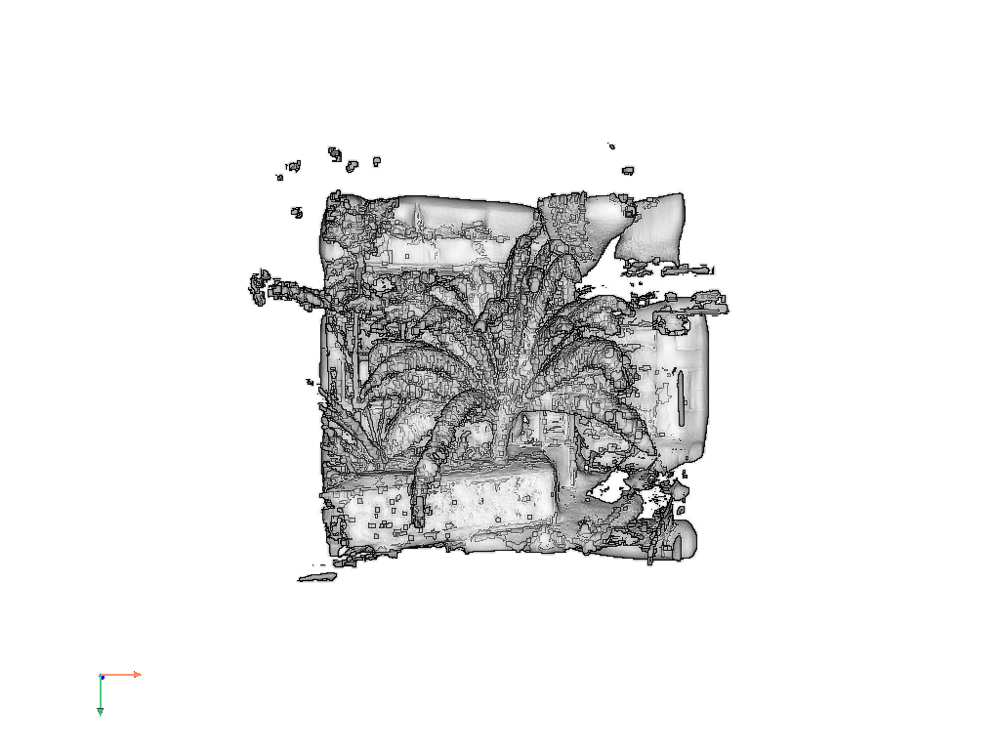

In [7]:
ele = -120
aza = 0



obj = pv.read('/home/tw554/plenoxels/opt/ckpt/debug_llff/coarse_pts_eval/0/pts.ply')

p = pv.Plotter(off_screen=False)
p.add_mesh(obj)

p.enable_eye_dome_lighting()

background = 'white'
# print(p.camera.position)
p.camera.position = (5, 5, 5)
p.camera.azimuth = aza
p.camera.elevation = ele

# p.camera.up = (1,0,0)

up = (0.00359995, -0.99988694,  0.01459981)

# p.show()

# cpos = p.show(return_cpos=True, return_viewer=False)

# c2w = np.array([[ 0.9993,  0.0073,  0.0369, -0.1499],
#         [-0.0090,  0.9989,  0.0454, -0.1344],
#         [-0.0365, -0.0457,  0.9983, -00290],
#         [ 0.0000,  0.0000,  0.0000,  1.0000]])

obj.plot(cpos=(p.camera.position, (0,0,0), up), eye_dome_lighting=True,
         point_size=0.1, show_axes=True, background=background)

In [70]:
p.camera.model_transform_matrix

array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.]])

In [72]:
p.camera.position

(0.6402879750653957, 0.5682028429218848, -8.595098615741929)

In [68]:
p = pv.Plotter(off_screen=False, window_size=img_size)
p.add_mesh(obj)

p.enable_eye_dome_lighting()


print(p.camera.position)

(7.679573334495943, 7.598024166862887, 7.608740962784212)


In [57]:
np.linspace(-150,-60, 11)

array([-150., -141., -132., -123., -114., -105.,  -96.,  -87.,  -78.,
        -69.,  -60.])

In [56]:
ups

array([ 0.00359995, -0.99988694,  0.01459981])

In [45]:
p.camera.azimuth = aza
p.camera.elevation = 10

p.camera.position

(13.964771354294982, -2.1984885730610437, 0.4972202359114268)

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


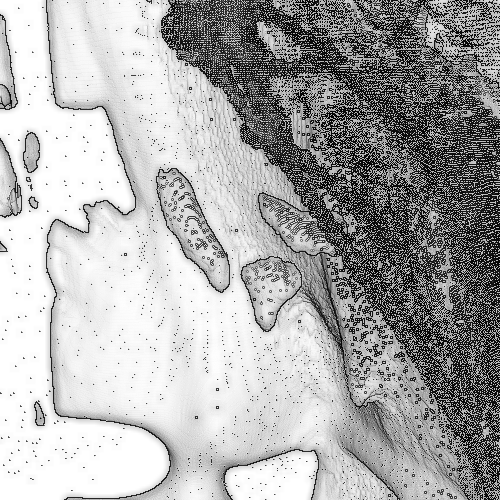

In [37]:
c2w = np.array([[ 0.9989, -0.0036, -0.0468,  0.1520],
        [ 0.0043,  0.9999,  0.0145, -0.0297],
        [ 0.0467, -0.0146,  0.9988, -0.0065],
        [ 0.0000,  0.0000,  0.0000,  1.0000]]) # @ np.diag([1,-1,-1,1])

up_rot = c2w[:3,:3]
ups = np.matmul(up_rot, np.array([0, -1.0, 0])[:, None])[..., 0]
ups /= np.linalg.norm(ups)

focal = np.zeros(3)
pos = c2w[:3,3] / 2 * 3

cpos = [pos, focal, ups]

obj.plot(cpos=cpos, eye_dome_lighting=True,
         point_size=1, show_axes=False, background=background, window_size=img_size)

In [51]:
ups

array([ 0.00359995, -0.99988694,  0.01459981])

In [32]:
cpos

[array([-0.1499, -0.1344, -0.029 ]),
 array([0., 0., 0.]),
 array([-0.00730021, -0.99892847,  0.0457013 ])]

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


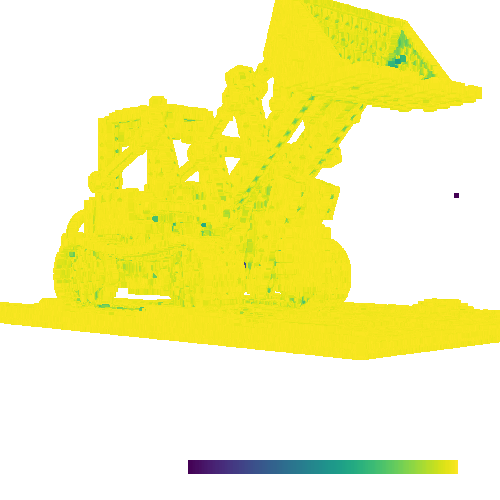

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


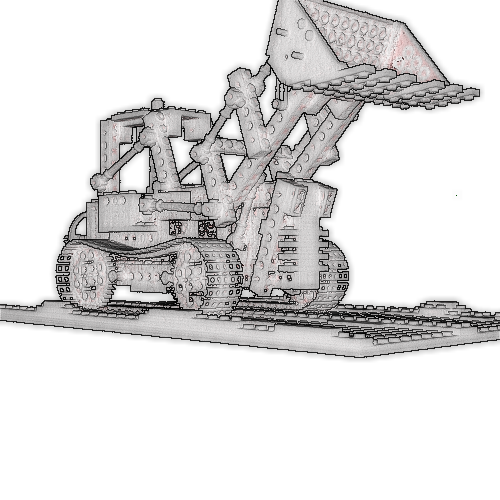

In [2]:


azas = np.linspace(0,360, 11)[:10]
eles = [0, 30]

obj = pv.read('/home/tw554/plenoxels/temp/mipnerf.ply')



img_size = (500, 500)

p = pv.Plotter(off_screen=True, window_size=img_size)
p.add_mesh(obj)
p.camera.position = (3, 3, 0)
p.camera.focal_point = (0., 0., 0.)

background = 'white'
p.set_background(background)

i = 0

ele = eles[0]
aza = azas[5]

p.camera.azimuth = aza
p.camera.elevation = ele

cpos = p.show(return_cpos=True, return_viewer=False)

obj.plot(scalars='RGB', rgb=True, cpos=cpos, eye_dome_lighting=True,
         point_size=1, show_axes=False, background=background, window_size=img_size)
        
        
        

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


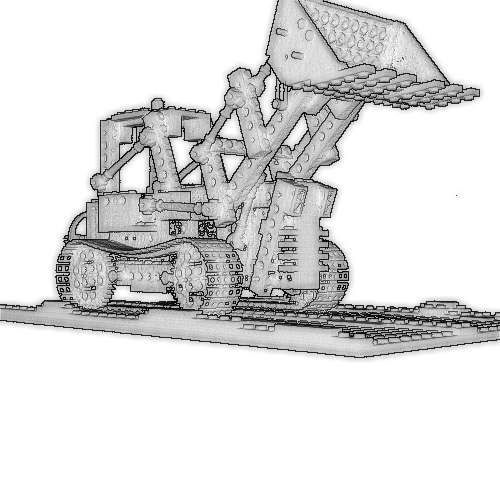

In [3]:
obj.plot(color='white', cpos=cpos, eye_dome_lighting=True,
         point_size=1, show_axes=False, background=background, window_size=img_size)

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


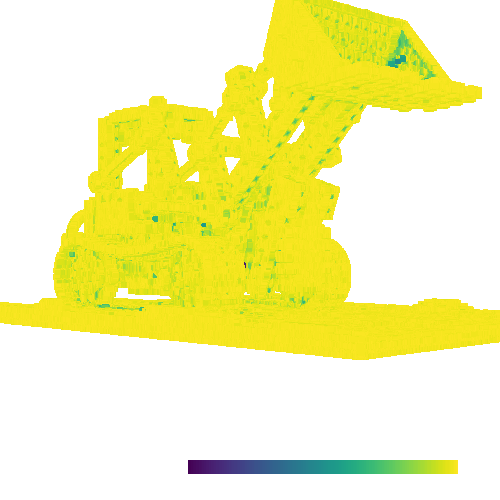

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


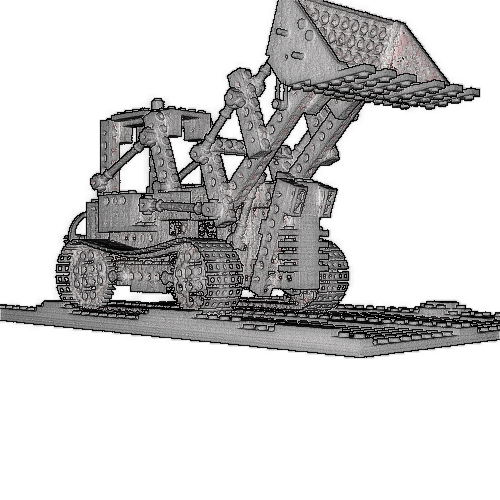

In [44]:


azas = np.linspace(0,360, 11)[:10]
eles = [0, 30]

obj = pv.read('/home/tw554/plenoxels/temp/mipnerf.ply')

mask = (obj.points < 1.5).all(axis=-1) & (obj.points > -1.5).all(axis=-1)
obj['mask'] = mask
obj = obj.threshold(scalars='mask', value=True)

img_size = (500, 500)

p = pv.Plotter(off_screen=True, window_size=img_size)
p.add_mesh(obj)
p.camera.position = (3, 3, 0)
p.camera.focal_point = (0., 0., 0.)

background = 'white'
p.set_background(background)

i = 0

ele = eles[0]
aza = azas[5]

p.camera.azimuth = aza
p.camera.elevation = ele

cpos = p.show(return_cpos=True, return_viewer=False)

obj.plot(scalars='RGB', rgb=True, cpos=cpos, eye_dome_lighting=True,
         point_size=1, show_axes=False, background=background, window_size=img_size)
        
        
        

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


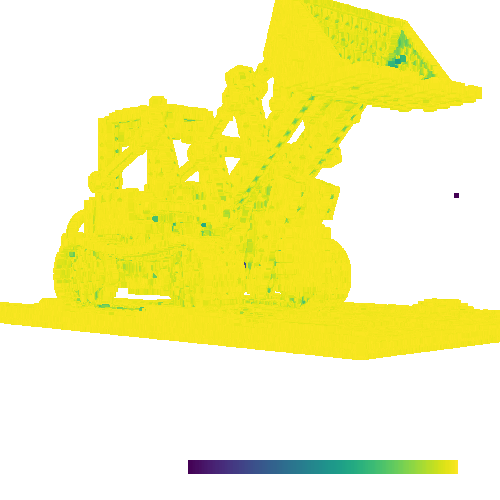

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


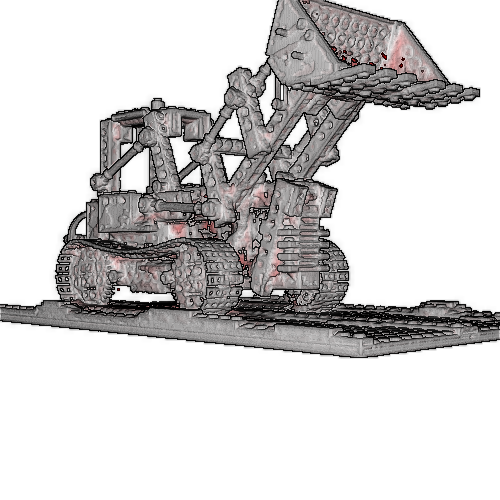

In [9]:


azas = np.linspace(0,360, 11)[:10]
eles = [0, 30]

obj2 = pv.read('/home/tw554/plenoxels/temp/ours.ply')

img_size = (500, 500)

p = pv.Plotter(off_screen=True, window_size=img_size)
p.add_mesh(obj)
p.camera.position = (3, 3, 0)
p.camera.focal_point = (0., 0., 0.)

background = 'white'
p.set_background(background)

i = 0

ele = eles[0]
aza = azas[5]

p.camera.azimuth = aza
p.camera.elevation = ele

cpos = p.show(return_cpos=True, return_viewer=False)

obj2.plot(scalars='RGB', rgb=True, cpos=cpos, eye_dome_lighting=True,
         point_size=1, show_axes=False, background=background, window_size=img_size)
        
        
        

In [10]:
obj2

PolyData (0x7f4b8818f400)
  N Cells:    19862465
  N Points:   19862465
  N Strips:   0
  X Bounds:   -6.442e-01, 6.401e-01
  Y Bounds:   -1.146e+00, 1.153e+00
  Z Bounds:   -3.488e-01, 1.004e+00
  N Arrays:   1

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


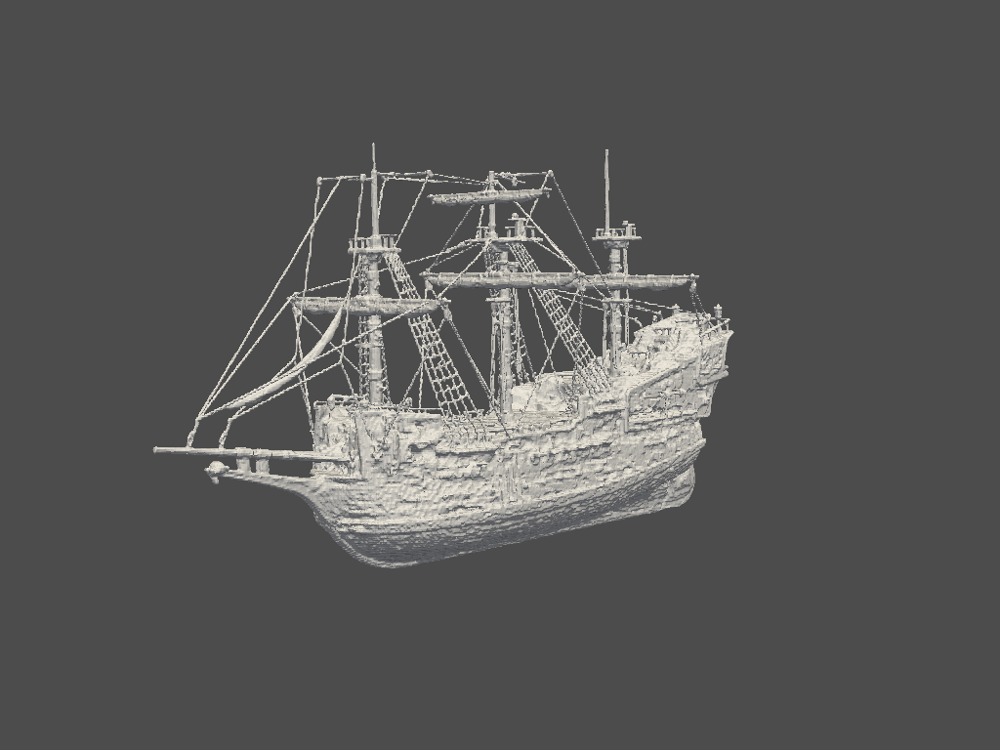

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


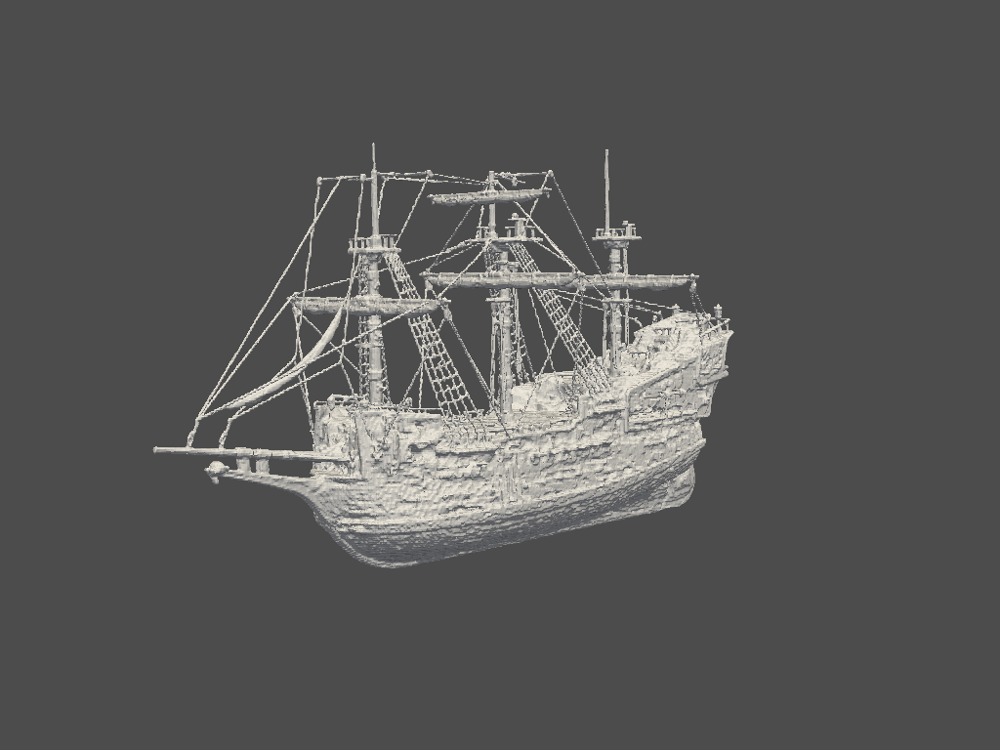

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


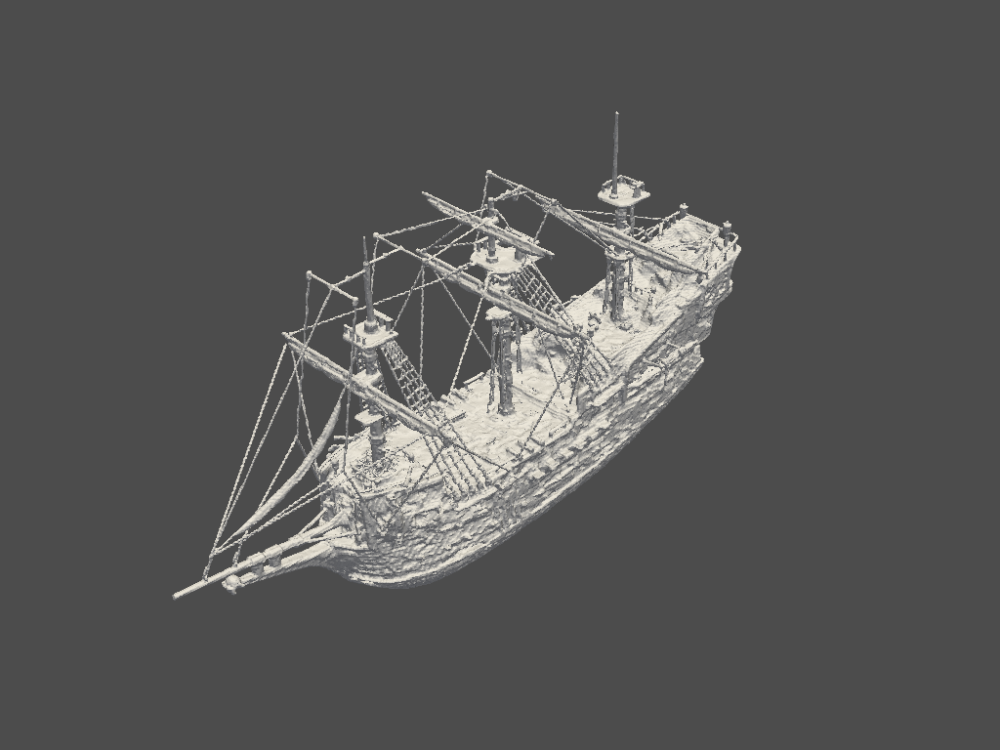

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


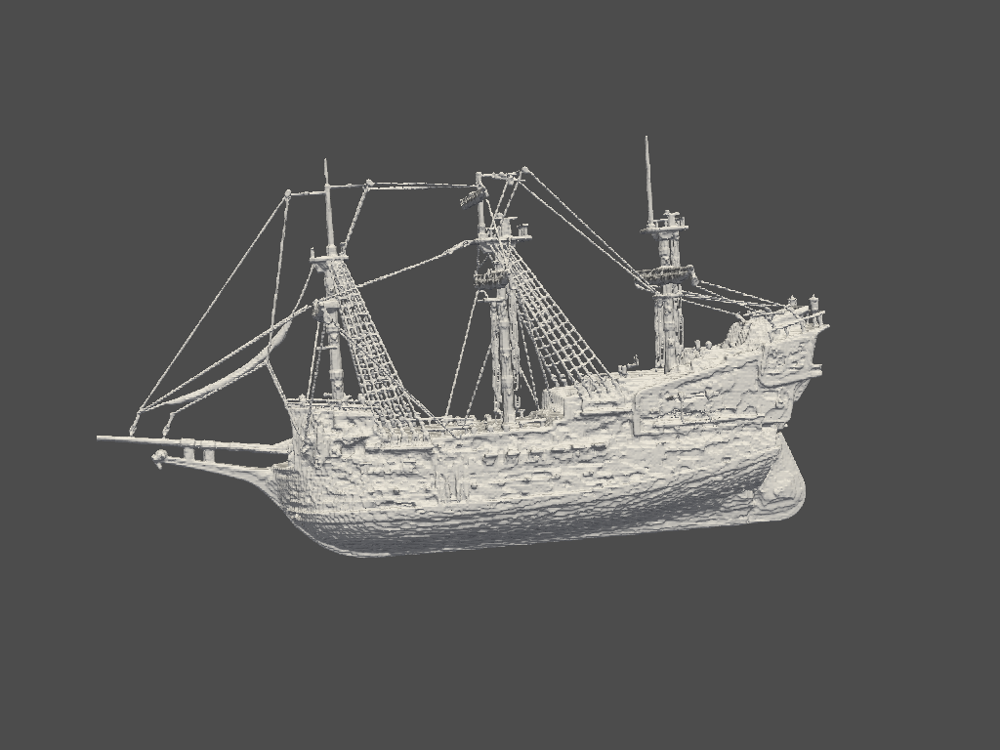

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


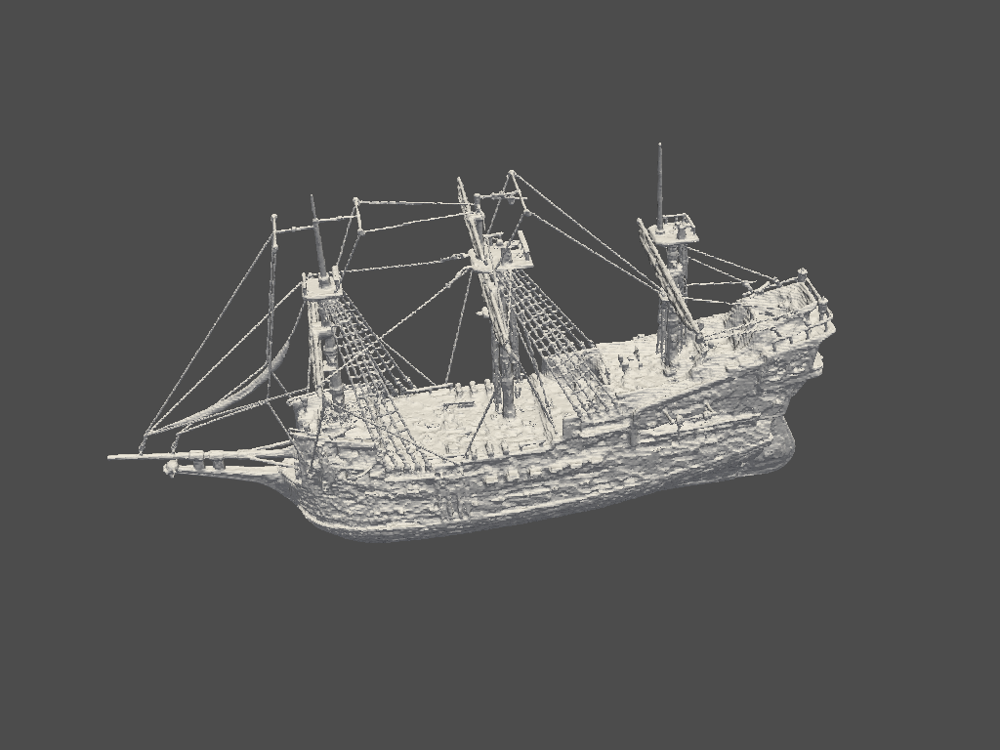

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


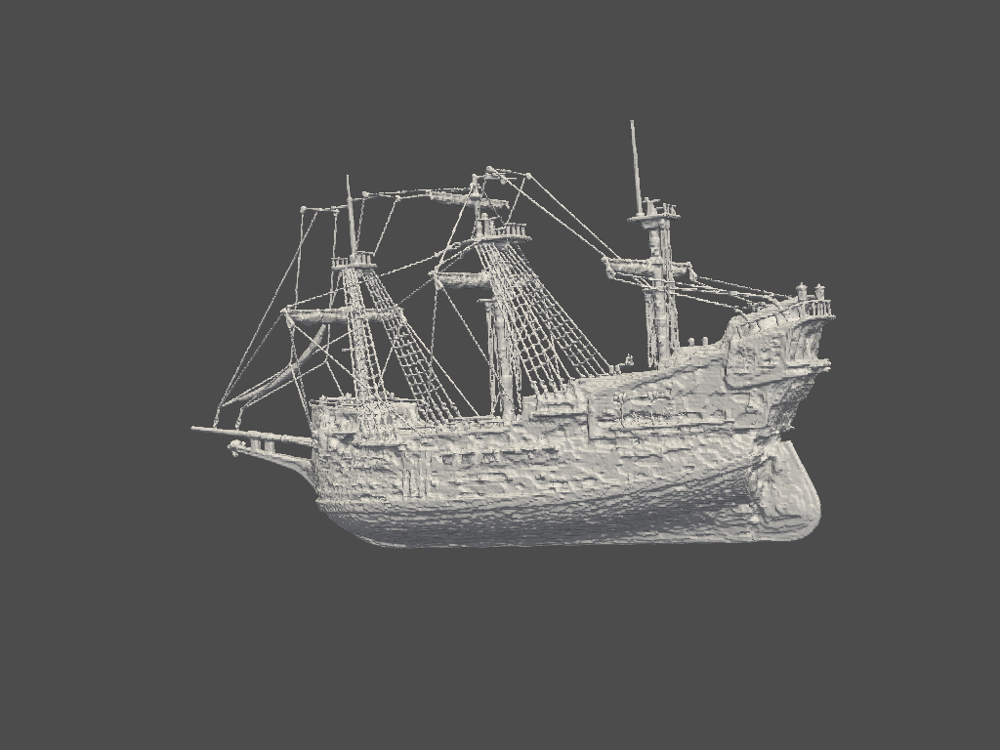

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


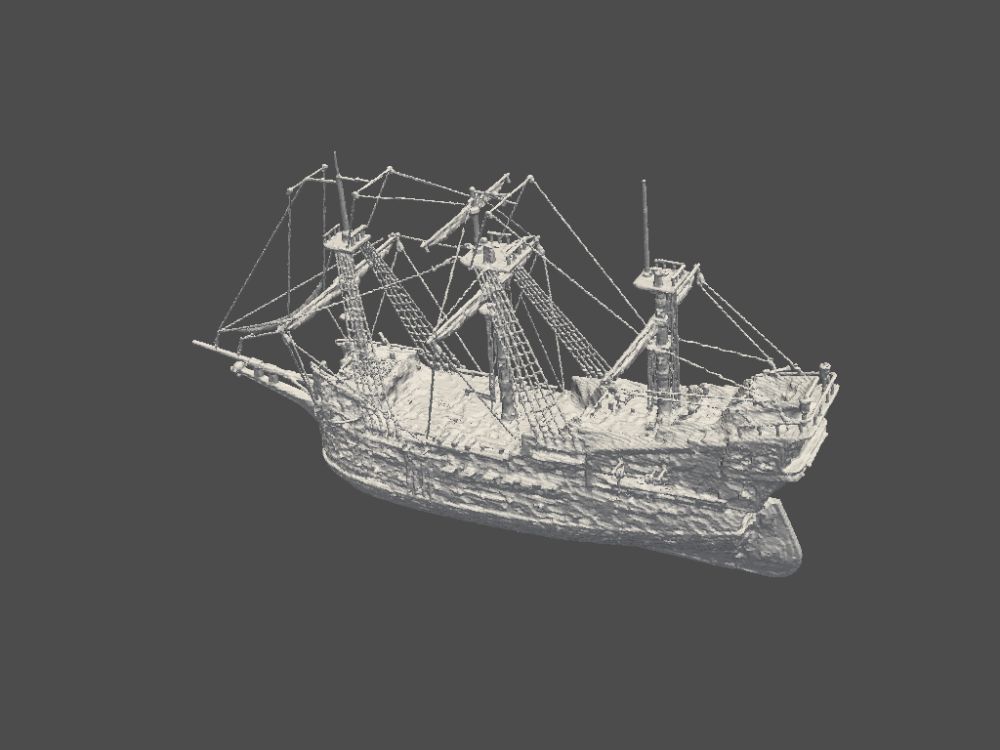

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


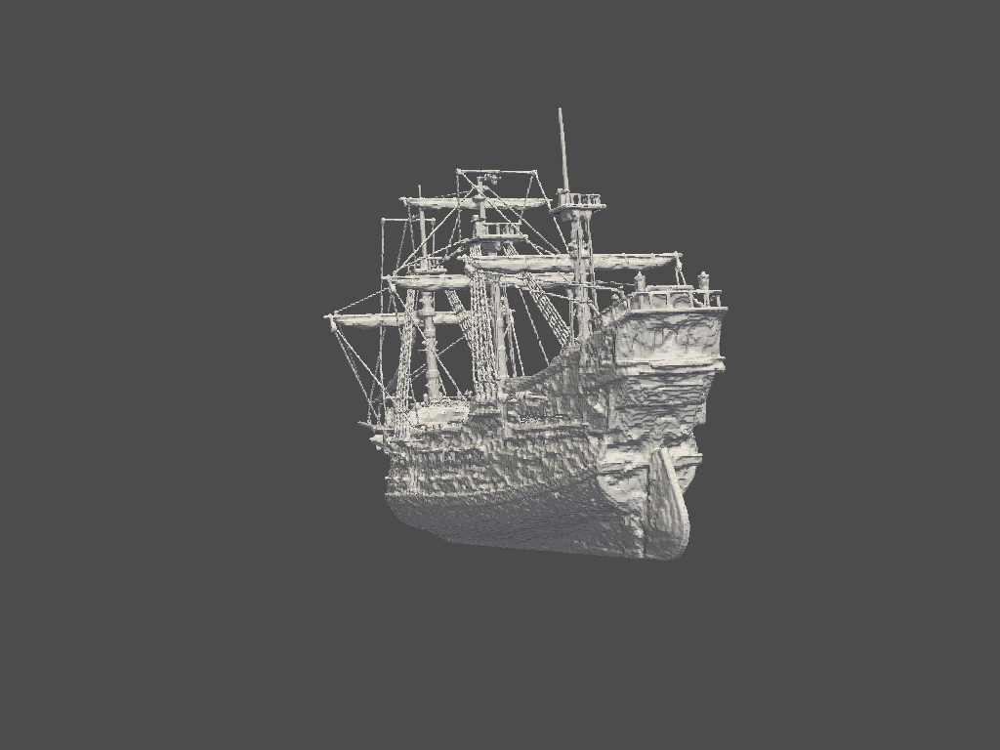

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


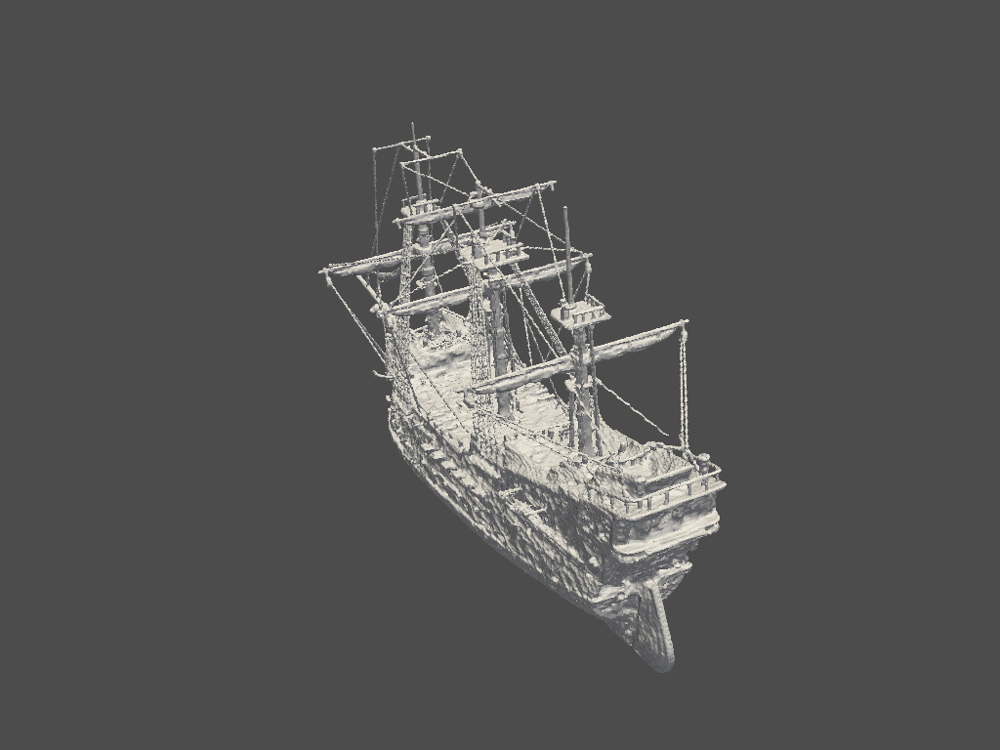

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


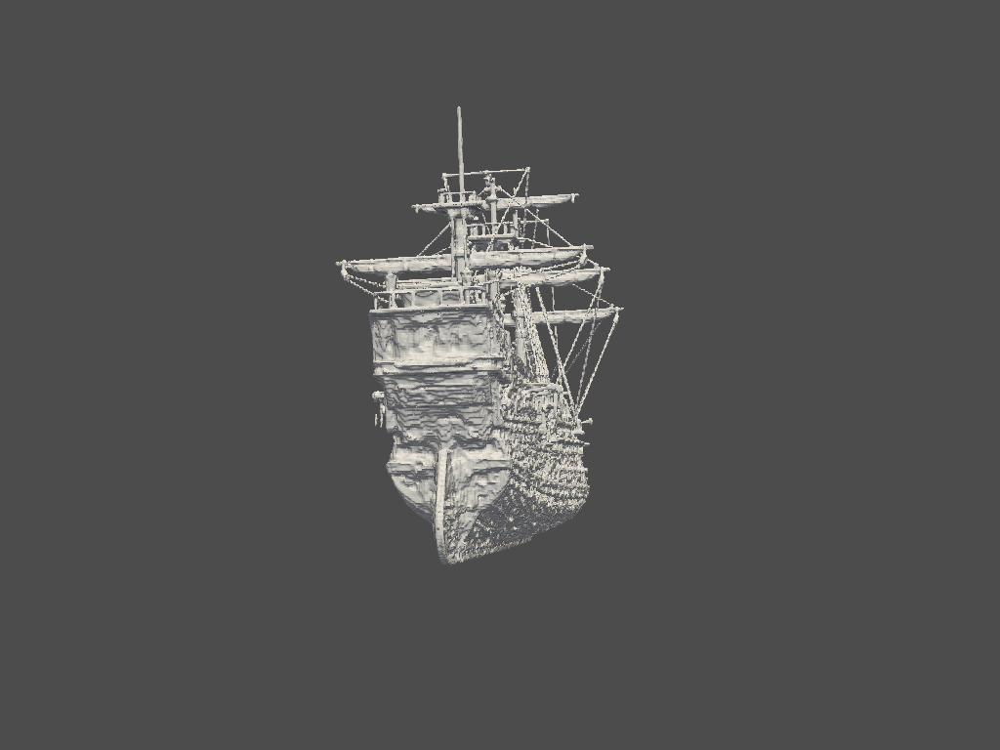

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


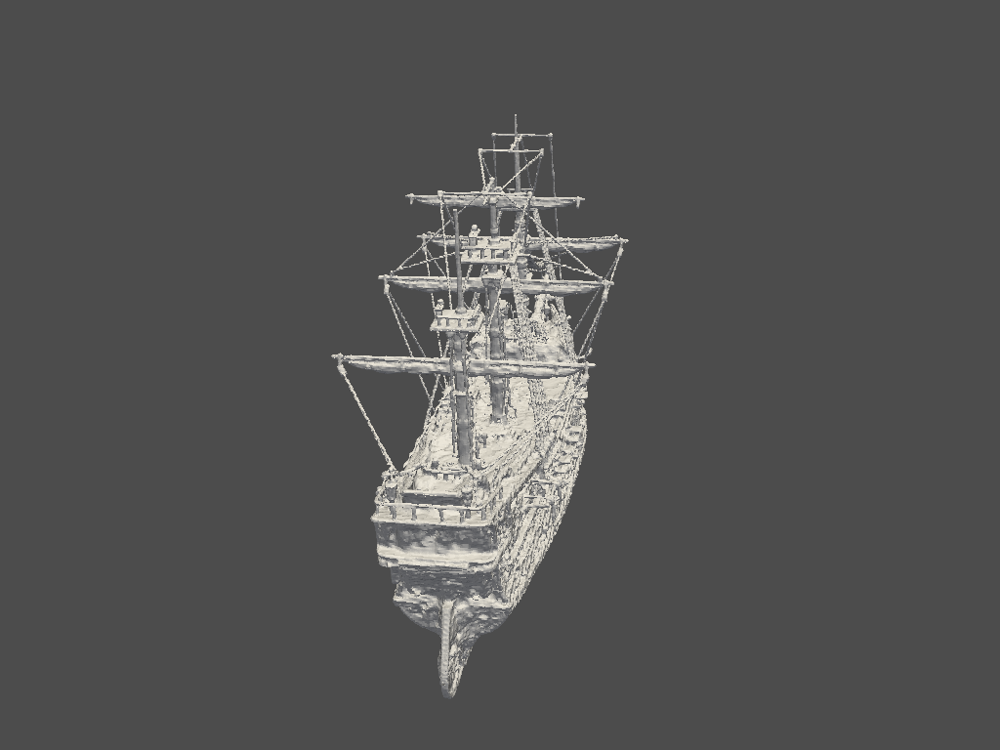

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


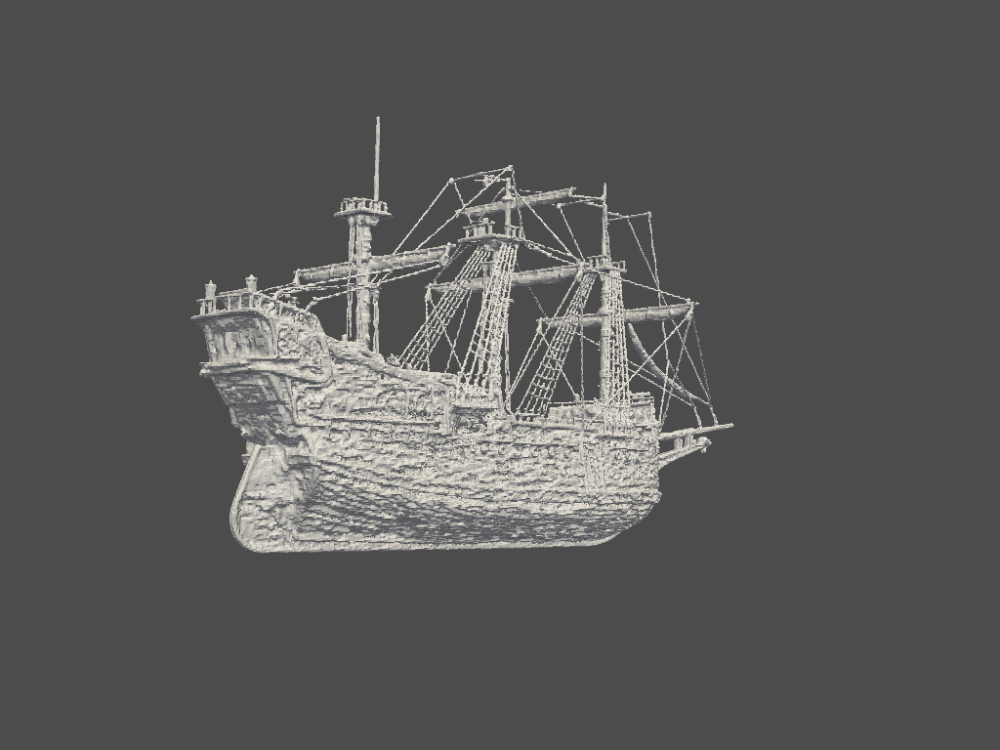

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


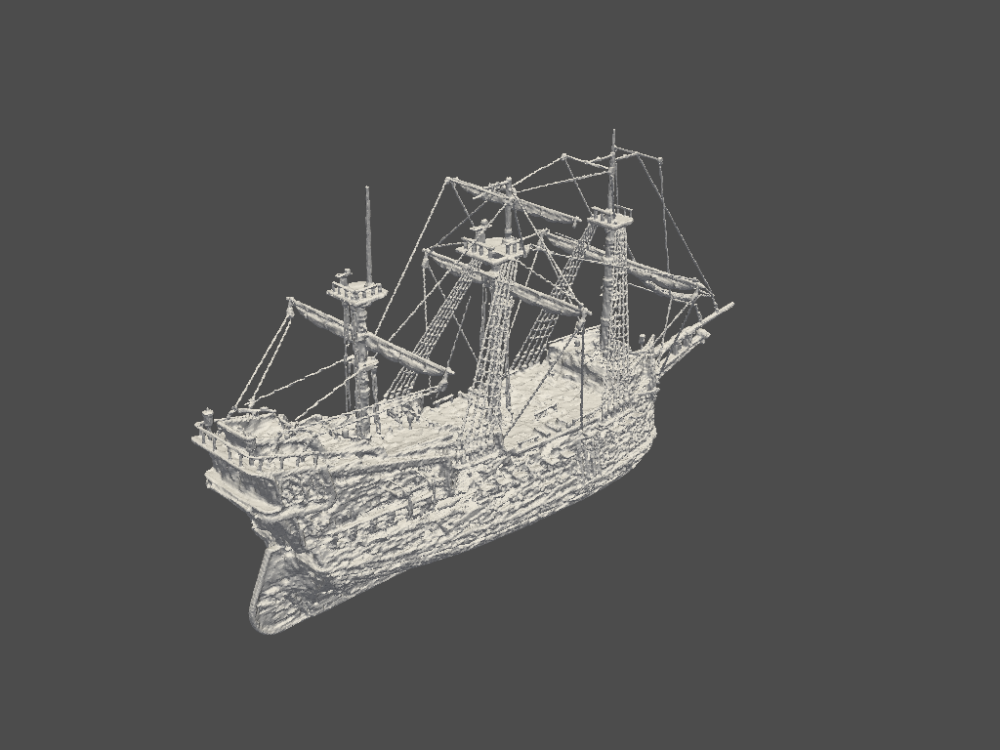

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


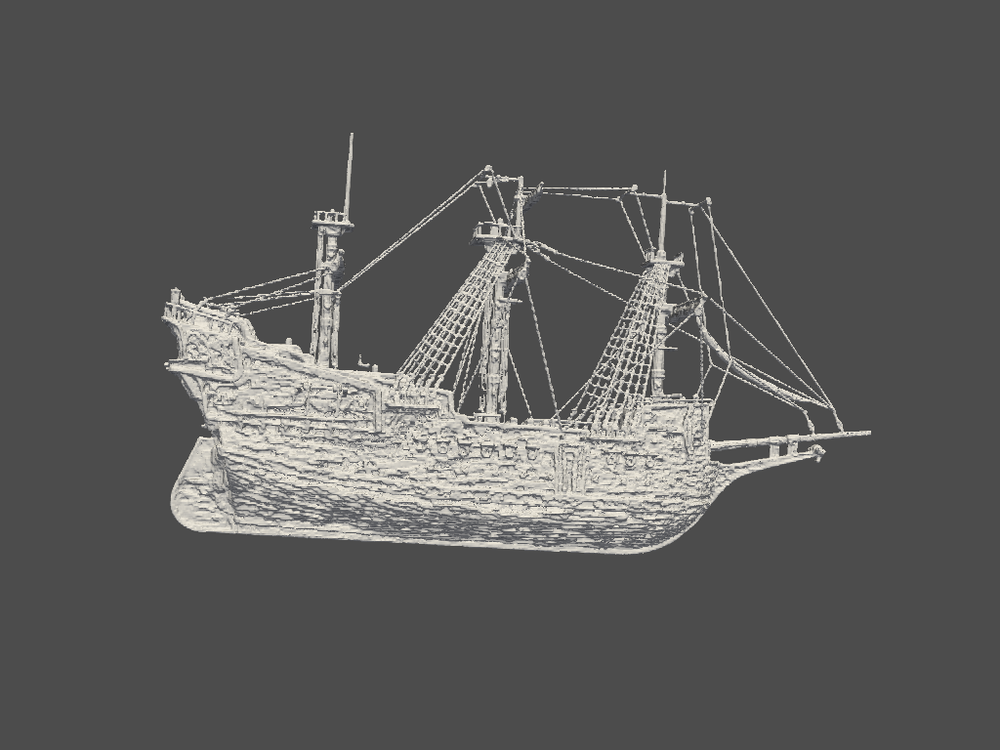

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


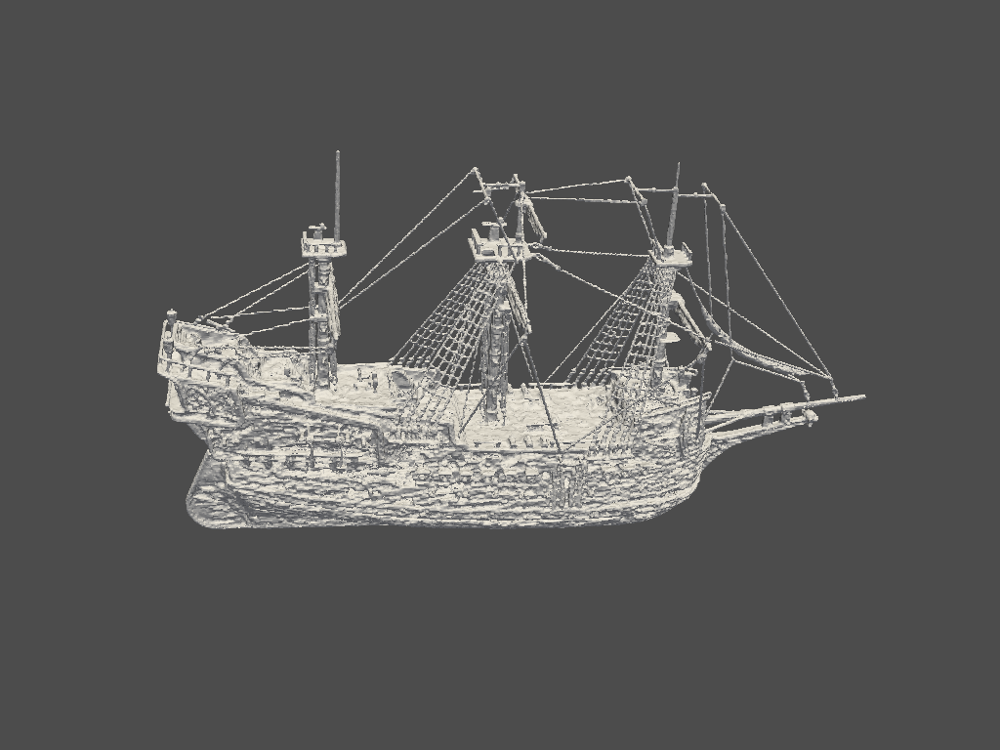

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


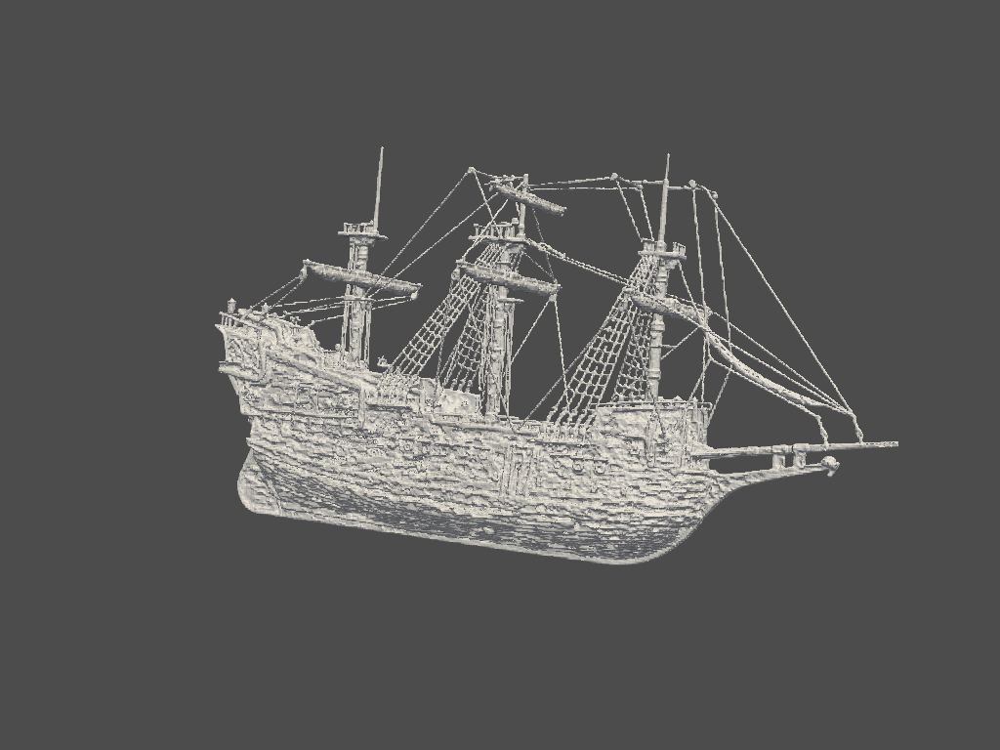

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


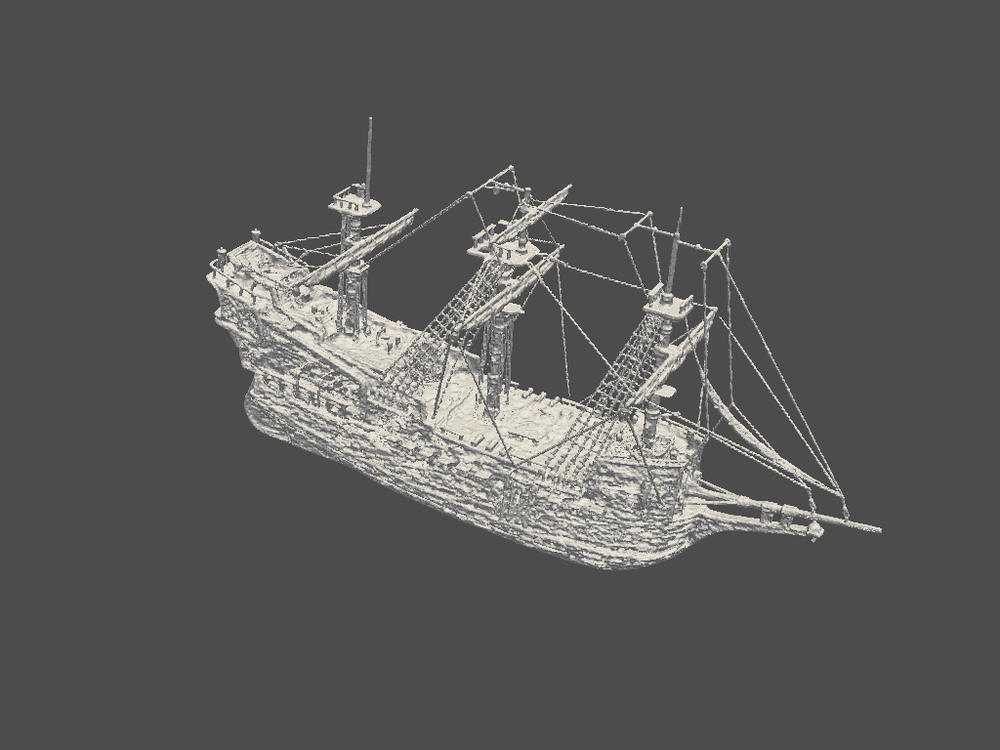

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


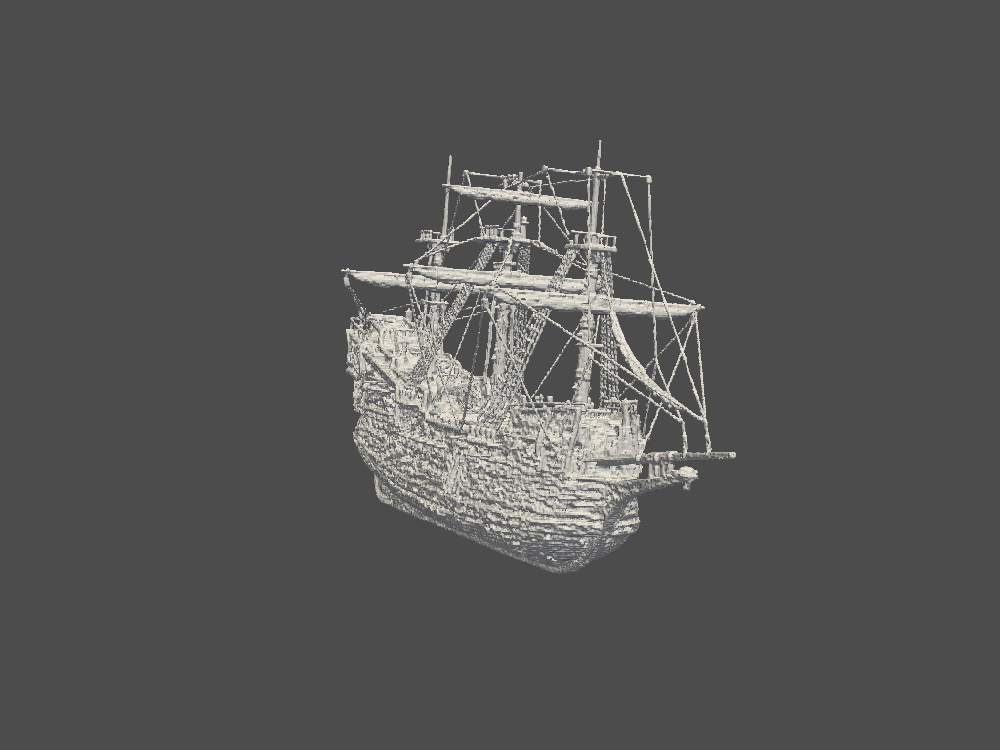

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


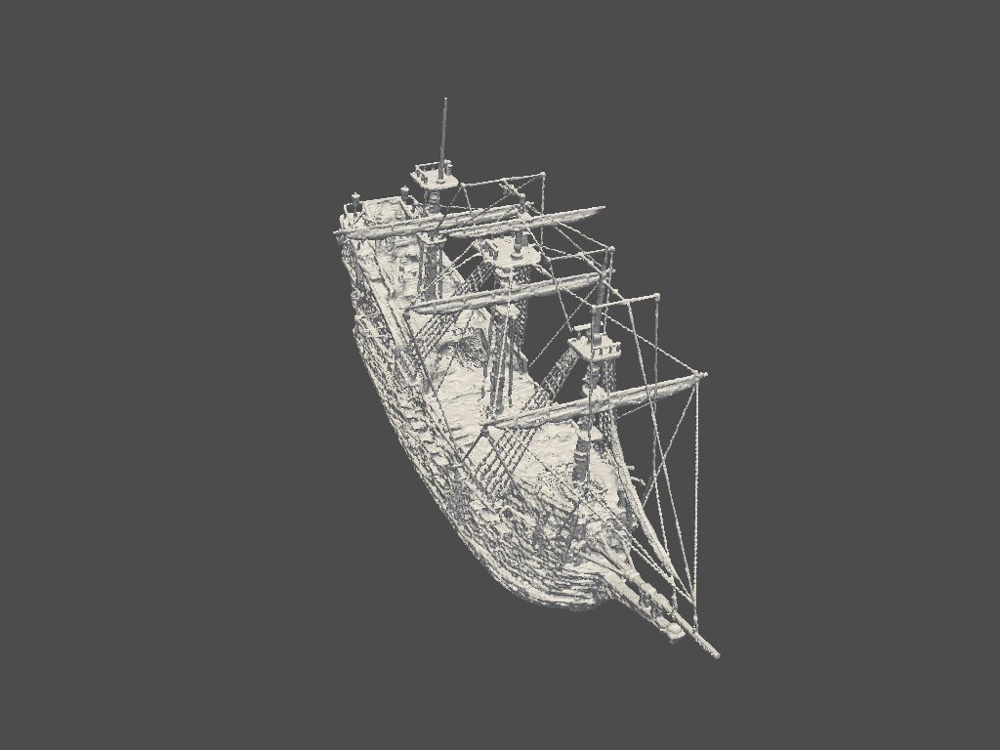

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


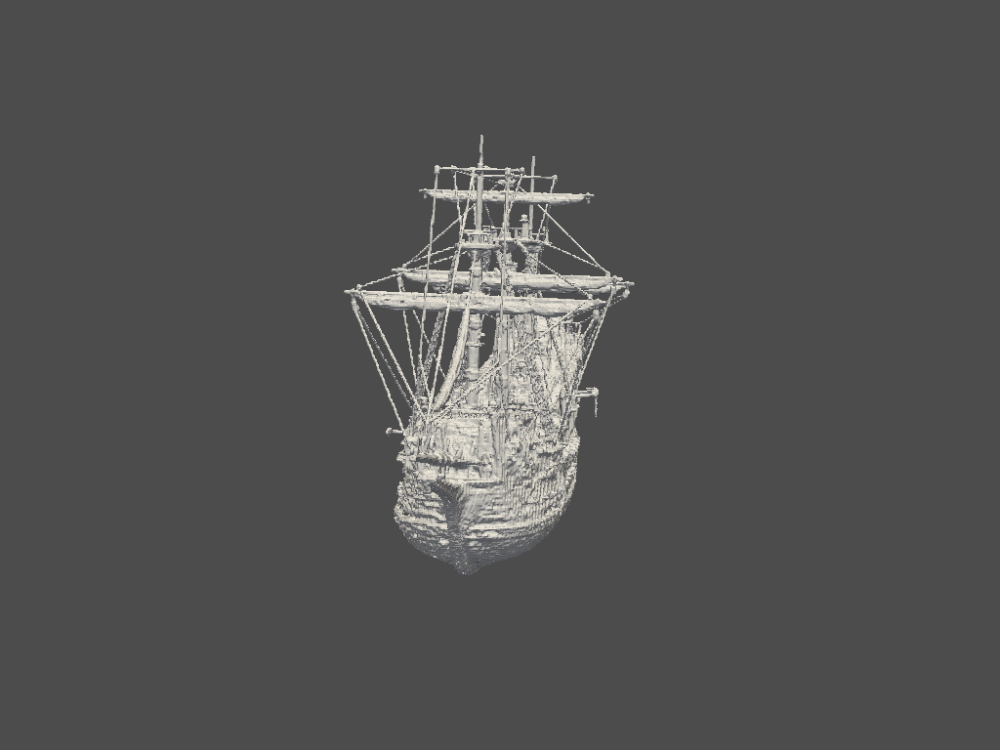

In [45]:
azas = np.linspace(0,360, 11)[:10]
eles = [0, 30]

obj = pv.read('/home/tw554/plenoxels/opt/scripts/mesh_0.003.ply')

p = pv.Plotter(off_screen=True)
p.add_mesh(obj)
p.camera.position = (3, 3, 0)
p.camera.focal_point = (0., 0., 0.)

i = 0

for ele in eles:
    for aza in azas:
        p.camera.azimuth = aza
        p.camera.elevation = ele
        
        p.show(screenshot=f'imgs/{i:05d}.png')
        i+=1
        
        
        

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


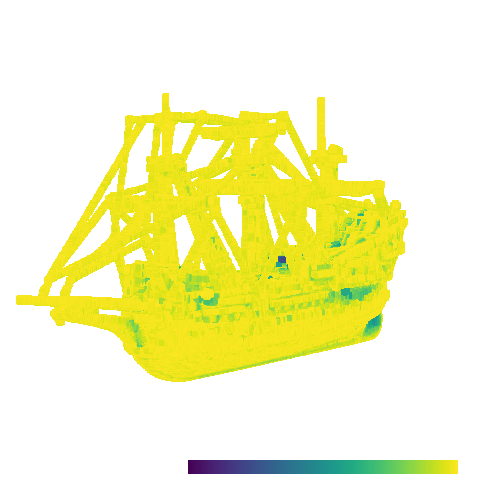

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


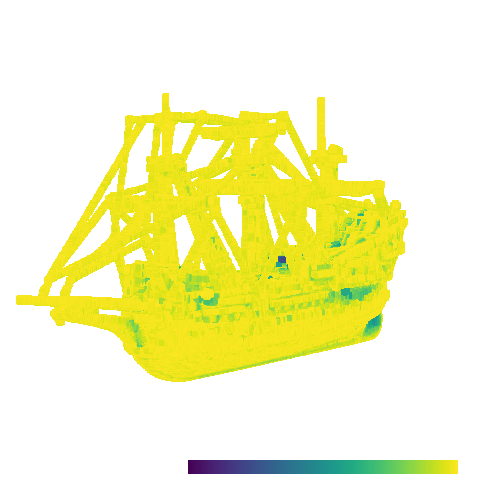

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


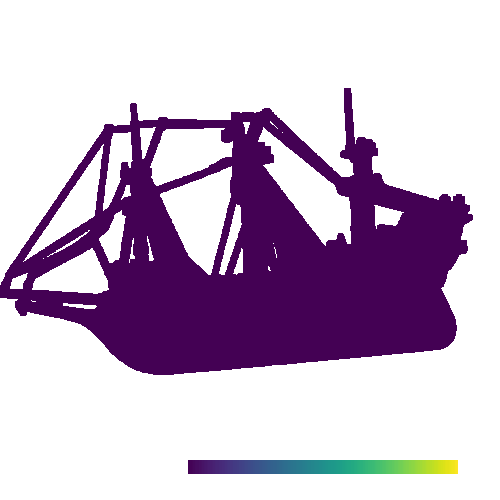

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


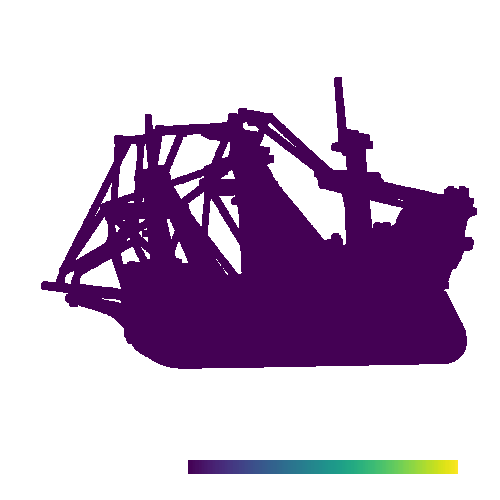

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


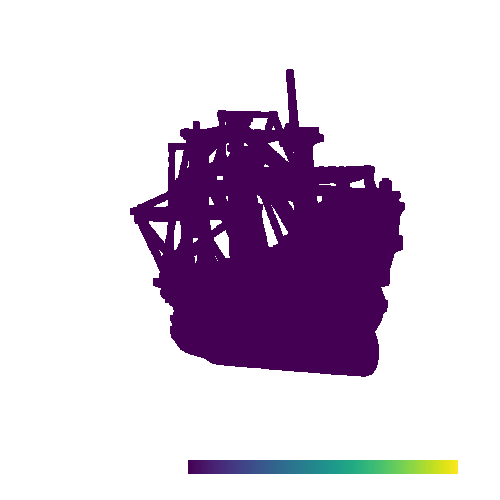

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


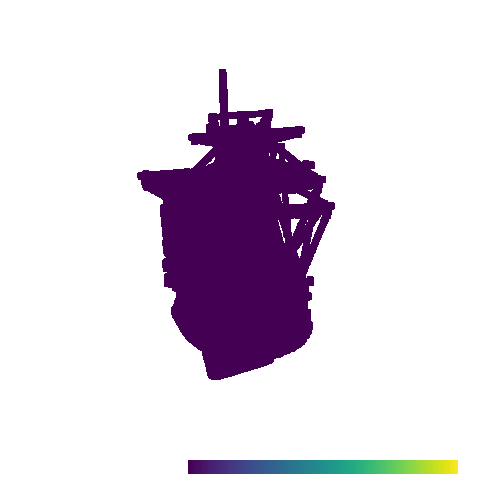

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


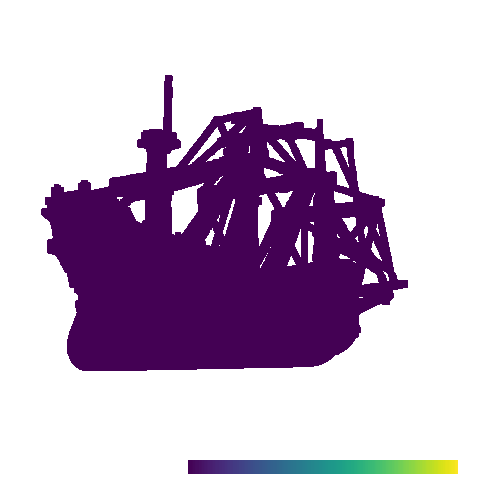

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


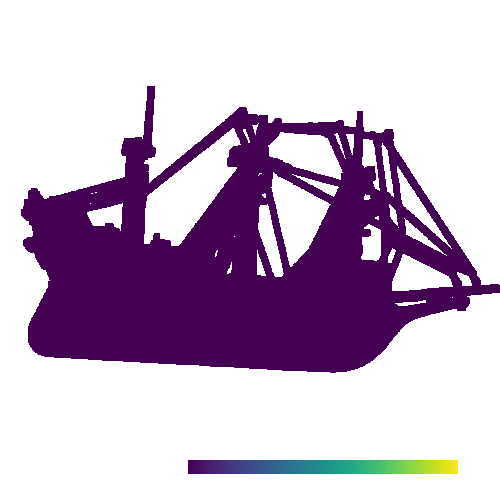

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


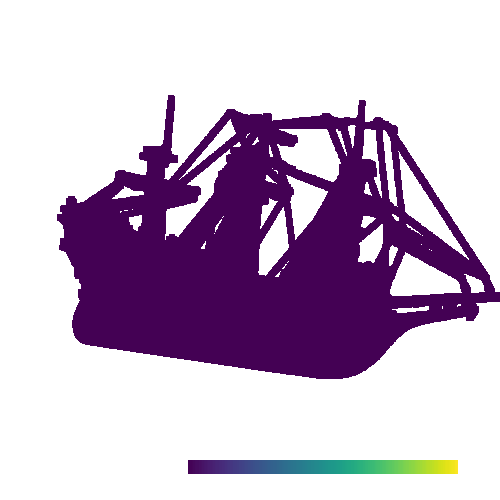

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


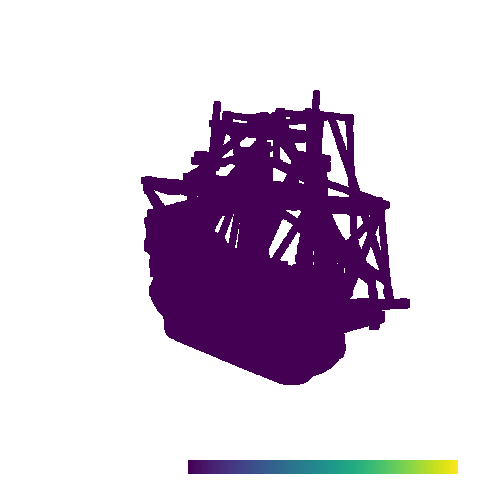

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


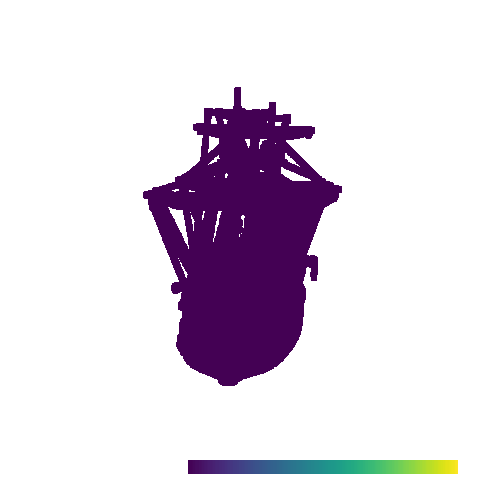

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


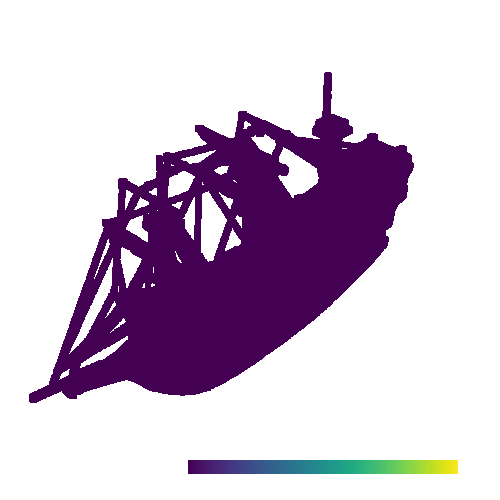

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


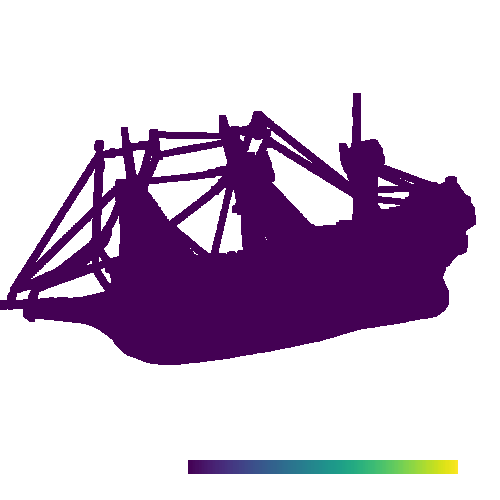

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


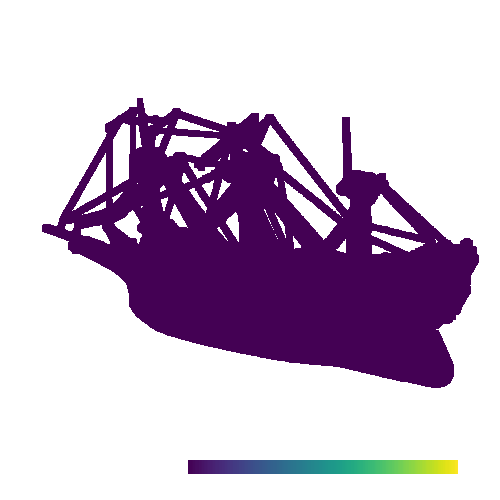

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


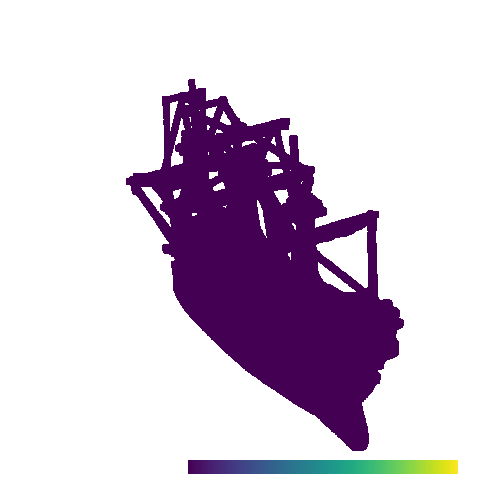

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


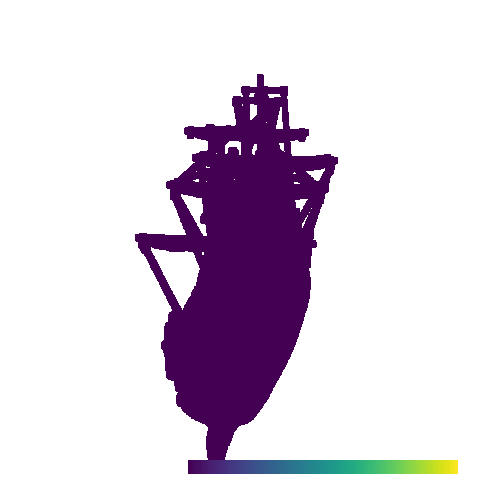

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


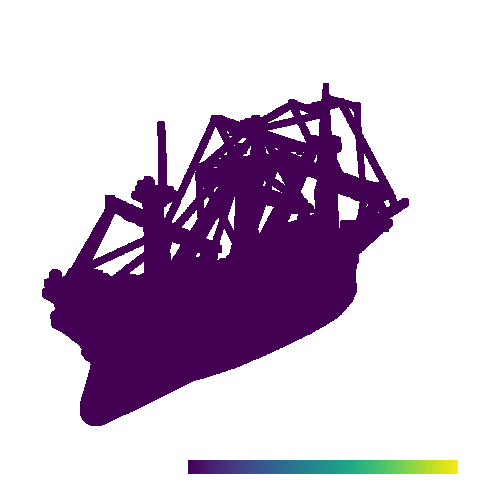

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


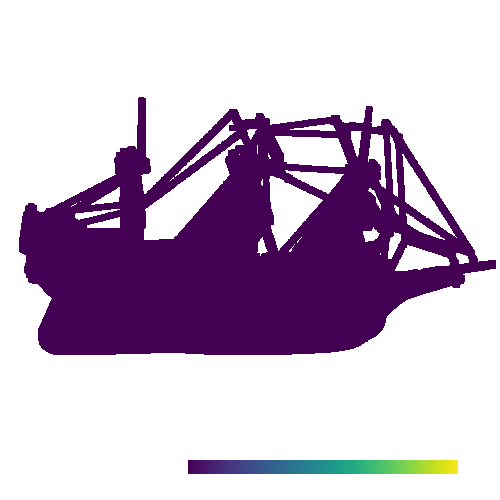

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


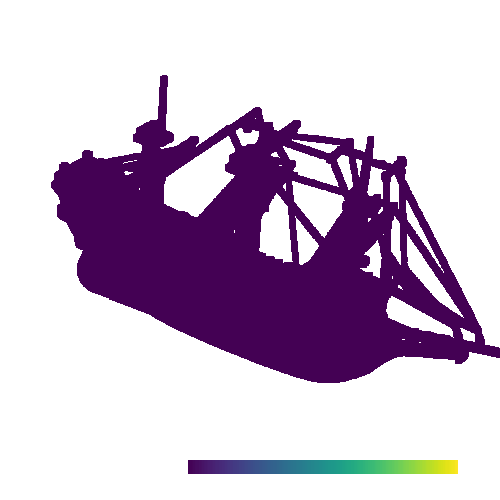

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


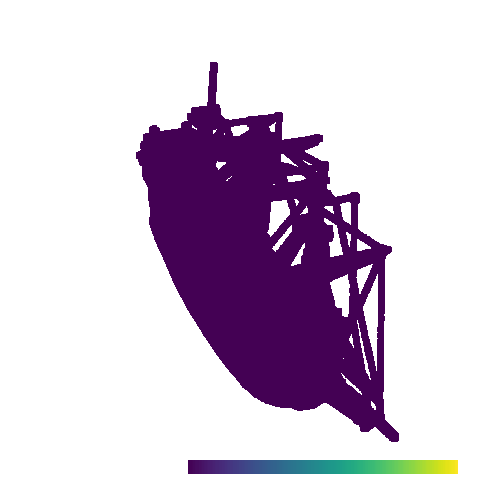

In [9]:
azas = np.linspace(0,360, 11)[:10]
eles = [0, 30]

obj = pv.read('/home/tw554/plenoxels/opt/ckpt/nerf/ship_re/ckpt_eval_cuvol/depth_spiral_mode_0.1/ckpt/vis_d2s.ply')

img_size = (500, 500)

p = pv.Plotter(off_screen=True, window_size=img_size)
p.add_mesh(obj)
p.camera.position = (3, 3, 0)
p.camera.focal_point = (0., 0., 0.)

background = 'white'
p.set_background(background)

i = 0
for ele in eles:
    for aza in azas:
        p.camera.azimuth = aza
        p.camera.elevation = ele
        
        cpos = p.show(return_cpos=True, return_viewer=False)
        
        obj.plot(scalars='RGB', rgb=True, cpos=cpos, 
                 screenshot=f'imgs/{i:05d}.png', off_screen=True, eye_dome_lighting=True,
                 point_size=1, show_axes=False, background=background, window_size=img_size, 
                 notebook=False,
                )
        
        i+=1
#         break
#     break
        

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


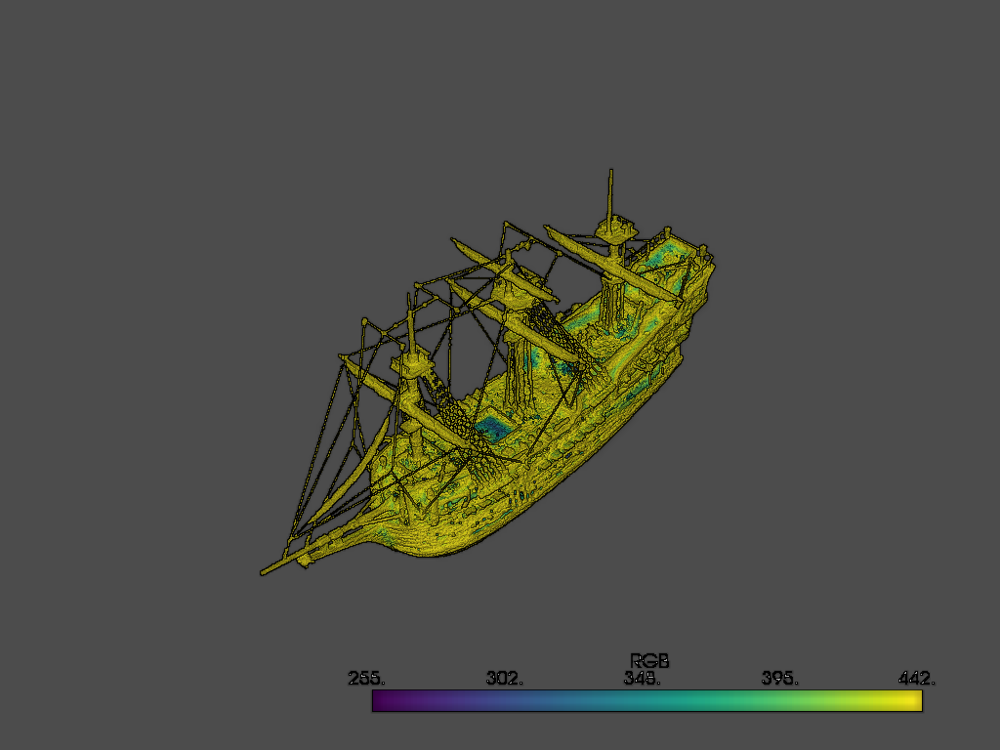

[(3.028494301029679, 2.953143554517266, 3.023191842028138),
 (0.09506464004516602, 0.01971389353275299, 0.08976218104362488),
 (0.0, 0.0, 1.0)]

In [74]:



obj = pv.read('/home/tw554/plenoxels/opt/ckpt/nerf/ship_re/ckpt_eval_cuvol/depth_spiral_mode_0.1/ckpt/vis_d2s.ply')
p = pv.Plotter()
p.add_mesh(obj, color='white', scalars='RGB', point_size=1)
p.enable_eye_dome_lighting()  # Turn on eye dome lighting here
p.show(return_cpos=True)


In [65]:
obj

PolyData (0x7efb1e57ec40)
  N Cells:    4112792
  N Points:   4112792
  N Strips:   0
  X Bounds:   -9.960e-01, 1.186e+00
  Y Bounds:   -3.383e-01, 3.777e-01
  Z Bounds:   -5.511e-01, 7.307e-01
  N Arrays:   2

/home/tw554/.conda/envs/voxel_sdf/lib/python3.8/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


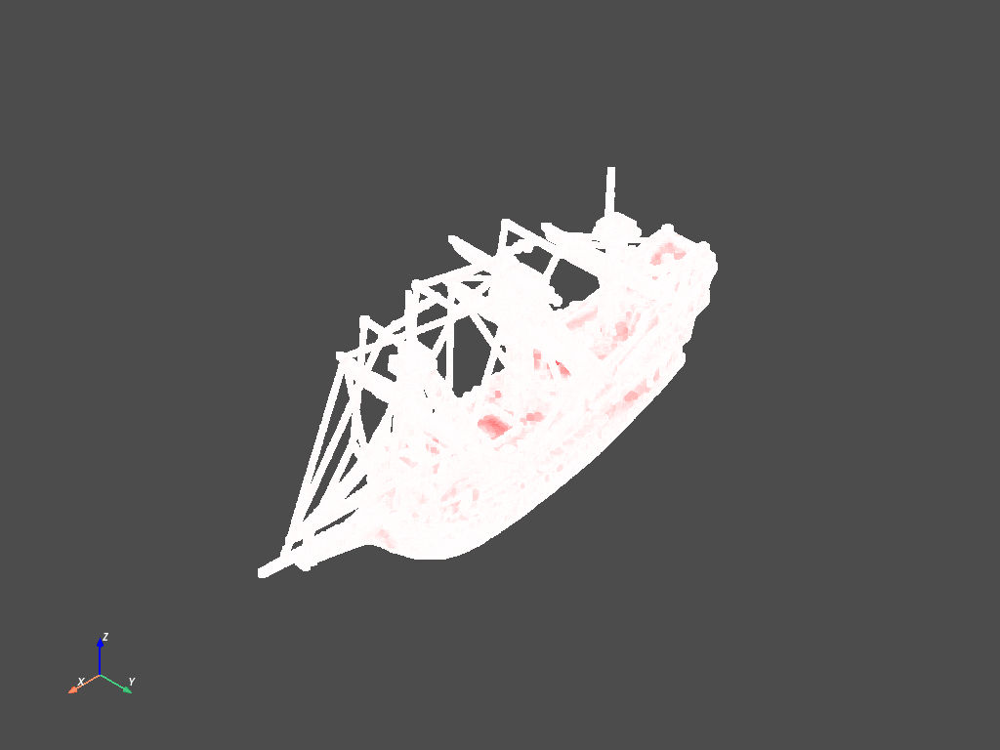

[(3.028494301029679, 2.953143554517266, 3.023191842028138),
 (0.09506464004516602, 0.01971389353275299, 0.08976218104362488),
 (0.0, 0.0, 1.0)]

In [67]:
obj.plot(scalars='RGB', rgb=True, return_cpos=True, return_viewer=False)